In [1]:
import numpy as np
import scanpy as sc
import seaborn as sns
from scipy.stats import median_abs_deviation

In [3]:
sc.settings.verbosity = 0
sc.settings.set_figure_params(
    dpi=80,
    facecolor="white",
    frameon=False,
)

In [4]:
# get data (bone marrow data of mononuclear cells from 12 healthy patients
# processed with previous filtering steps
adata = sc.read_10x_h5(
    filename="filtered_feature_bc_matrix.h5",
    backup_url="https://figshare.com/ndownloader/files/39546196",
)
adata

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


AnnData object with n_obs × n_vars = 16934 × 36601
    var: 'gene_ids', 'feature_types', 'genome'

In [5]:
# var_names_make_unique() which makes the variable name unique by appending a number string to each duplicate index element:
adata.var_names_make_unique()
adata

AnnData object with n_obs × n_vars = 16934 × 36601
    var: 'gene_ids', 'feature_types', 'genome'

In [6]:
# n_obs 16,934 x n_vars 36,601. This translates into barcodes x number of transcripts
# correct and remove low-quality cells, contamination of cell-free RNA or doublets
# 1. calculate the QC covariates or metric
# get genes
# mitochondrial genes
adata.var["mt"] = adata.var_names.str.startswith("MT-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
# hemoglobin genes.
adata.var["hb"] = adata.var_names.str.contains(("^HB[^(P)]"))
# alculate the respective QC metrics with scanpy.
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo", "hb"], inplace=True, percent_top=[20], log1p=True
)
adata


AnnData object with n_obs × n_vars = 16934 × 36601
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

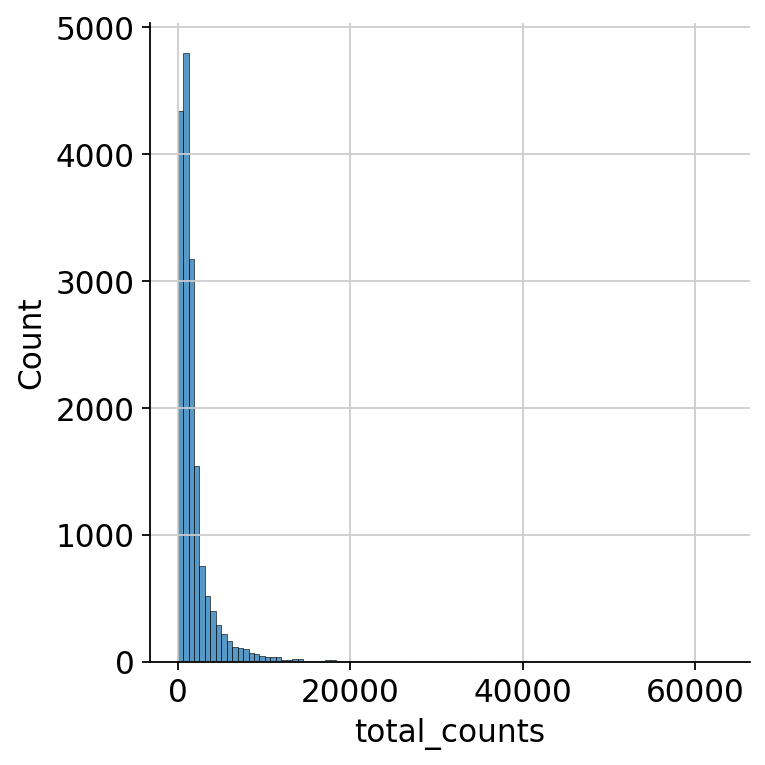

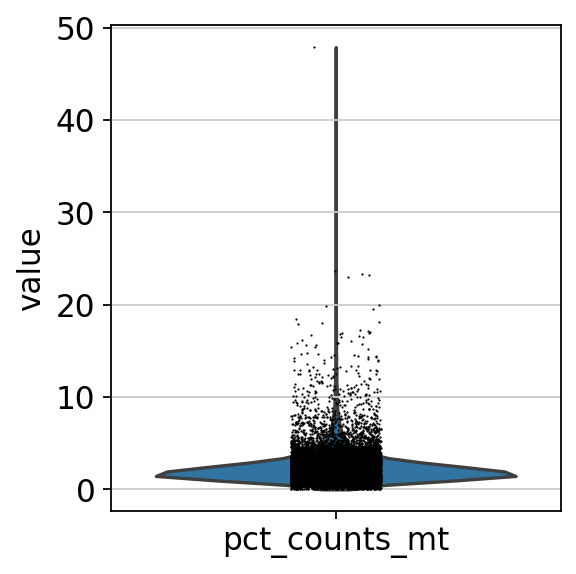

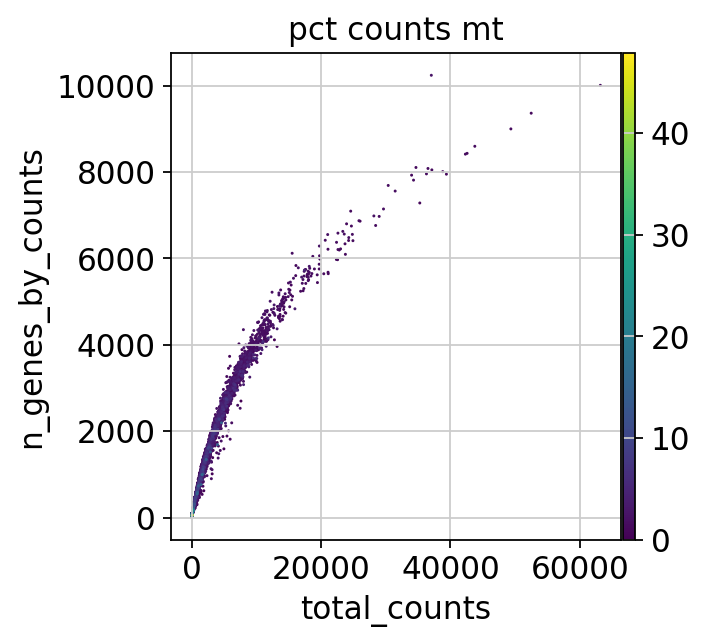

In [7]:
# plot 
p1 = sns.displot(adata.obs["total_counts"], bins=100, kde=False)
# sc.pl.violin(adata, 'total_counts')
p2 = sc.pl.violin(adata, "pct_counts_mt")
p3 = sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

In [8]:
# plots indicate that some reads have a relatively high percentage of mitochondrial counts which are often associated with cell degradation. But since number of counts per cell is sufficiently high and percentage of mitochondrial reads is for most cells below 20 % we can still process the data
# get automatic thresholding function based on 5*MAD
def is_outlier(adata, metric: str, nmads: int):
    M = adata.obs[metric]
    outlier = (M < np.median(M) - nmads * median_abs_deviation(M)) | (
        np.median(M) + nmads * median_abs_deviation(M) < M
    )
    return outlier
#apply function to log1p_total_counts, log1p_n_genes_by_counts and pct_counts_in_top_20_genes QC covariates each with a threshold of 5 MADs
adata.obs["outlier"] = (
    is_outlier(adata, "log1p_total_counts", 5)
    | is_outlier(adata, "log1p_n_genes_by_counts", 5)
    | is_outlier(adata, "pct_counts_in_top_20_genes", 5)
)
adata.obs.outlier.value_counts()

outlier
False    16065
True       869
Name: count, dtype: int64

In [9]:
# pct_counts_Mt is filtered with 3 MADs. Additionally, cells with a percentage of mitochondrial counts exceeding 8 % are filtered out.
adata.obs["mt_outlier"] = is_outlier(adata, "pct_counts_mt", 3) | (
    adata.obs["pct_counts_mt"] > 8
)
adata.obs.mt_outlier.value_counts()

mt_outlier
False    15240
True      1694
Name: count, dtype: int64

Total number of cells: 16934
Number of cells after filtering of low quality cells: 14814


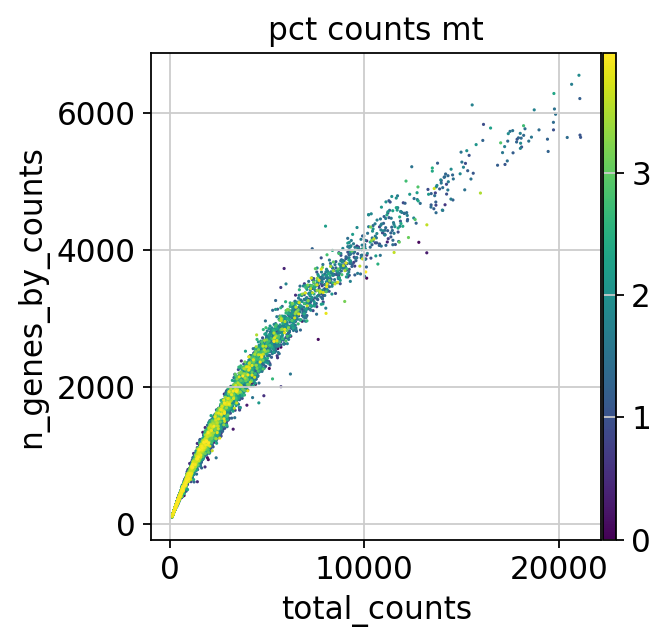

In [10]:
# filter our AnnData object based on these two additional columns
print(f"Total number of cells: {adata.n_obs}")
adata = adata[(~adata.obs.outlier) & (~adata.obs.mt_outlier)].copy()

print(f"Number of cells after filtering of low quality cells: {adata.n_obs}")
#plot 
p1 = sc.pl.scatter(adata, "total_counts", "n_genes_by_counts", color="pct_counts_mt")

In [11]:
# correct for ambient RNA
# load required R packages
import anndata2ri
import logging

import rpy2.rinterface_lib.callbacks as rcb
import rpy2.robjects as ro

rcb.logger.setLevel(logging.ERROR)
ro.pandas2ri.activate()
anndata2ri.activate()

%load_ext rpy2.ipython

In [12]:
%%R
library(SoupX)

RRuntimeError: Error in (function (filename = "Rplot%03d.png", width = 480, height = 480,  : 
  Graphics API version mismatch


In [13]:
# get data in right format for R
adata_pp = adata.copy()
sc.pp.normalize_per_cell(adata_pp)
sc.pp.log1p(adata_pp)
# compute pca
sc.pp.pca(adata_pp)
sc.pp.neighbors(adata_pp)
sc.tl.leiden(adata_pp, key_added="soupx_groups")
# Preprocess variables for SoupX
soupx_groups = adata_pp.obs["soupx_groups"]

In [14]:
# delete copy
del adata_pp

In [15]:
# save the cell names, gene names and the data matirx 
cells = adata.obs_names
genes = adata.var_names
data = adata.X.T

In [16]:
# SoupX additionally required the raw gene by cells matrix
adata_raw = sc.read_10x_h5(
    filename="raw_feature_bc_matrix.h5",
    backup_url="https://figshare.com/ndownloader/files/39546217",
)
adata_raw.var_names_make_unique()
data_tod = adata_raw.X.T

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [17]:
%%R -i data -i data_tod -i genes -i cells -i soupx_groups -o out 
# first construct a so called SoupChannel from the table of droplets and the table of cells. 
# Next, we add metadata to the SoupChannel object which can be any metadata in the form of a data.frame.
library(Matrix)
library(SoupX)
# specify row and column names of data
rownames(data) <- genes
colnames(data) <- cells
# ensure correct sparse format for table of counts and table of droplets
sparse_data <- as(data, "sparseMatrix")
sparse_data_tod <- as(data_tod, "sparseMatrix")

# Generate SoupChannel Object for SoupX 
sc = SoupChannel(data_tod, data, calcSoupProfile = FALSE)

# Add extra meta data to the SoupChannel object
soupProf = data.frame(row.names = rownames(data), est = rowSums(data)/sum(data), counts = rowSums(data))
sc = setSoupProfile(sc, soupProf)
# Set cluster information in SoupChannel
sc = setClusters(sc, soupx_groups)

# Estimate contamination fraction
sc  = autoEstCont(sc, doPlot=FALSE)
# Infer corrected table of counts and rount to integer
out = adjustCounts(sc, roundToInt = TRUE)

RRuntimeError: Error in (function (filename = "Rplot%03d.png", width = 480, height = 480,  : 
  Graphics API version mismatch


In [18]:
# store soupx correct counts as an additional layer
adata.layers["counts"] = adata.X
adata.layers["soupX_counts"] = out.T
adata.X = adata.layers["soupX_counts"]

NameError: name 'out' is not defined

In [19]:
# write out data for R
type(cells)
type(genes)
type(data)
type(data_tod)

scipy.sparse._csc.csc_matrix

In [20]:
#adata_df1=adata.to_df(layer=None)
#adata_df1.to_csv("anndata_filtered.txt",sep='\t', na_rep='', quoting=None)

In [21]:
#adata_df2=adata_raw.to_df(layer=None)
#adata_df2.to_csv("anndata_raw.txt",sep='\t', na_rep='', quoting=None)

In [22]:
#  filter out genes that are not detected in at least 20 cells 
print(f"Total number of genes: {adata.n_vars}")

# Min 20 cells - filters out 0 count genes
sc.pp.filter_genes(adata, min_cells=20)
print(f"Number of genes after cell filter: {adata.n_vars}")

data_mat = adata.X.T

Total number of genes: 36601
Number of genes after cell filter: 20432


In [5]:
%%R
library(Seurat)
library(scater)
library(scDblFinder)
library(BiocParallel)

RRuntimeError: Error in (function (filename = "Rplot%03d.png", width = 480, height = 480,  : 
  Graphics API version mismatch


In [23]:
# normalization
# import packages
import scanpy as sc
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import anndata2ri
import logging
from scipy.sparse import issparse

import rpy2.rinterface_lib.callbacks as rcb
import rpy2.robjects as ro

sc.settings.verbosity = 0
sc.settings.set_figure_params(
    dpi=80,
    facecolor="white",
    # color_map="YlGnBu",
    frameon=False,
)

rcb.logger.setLevel(logging.ERROR)
ro.pandas2ri.activate()
anndata2ri.activate()

%load_ext rpy2.ipython

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [24]:
# load QC filtered data
adata = sc.read(
    filename="s4d8_quality_control.h5ad",
    backup_url="https://figshare.com/ndownloader/files/40014331",
)

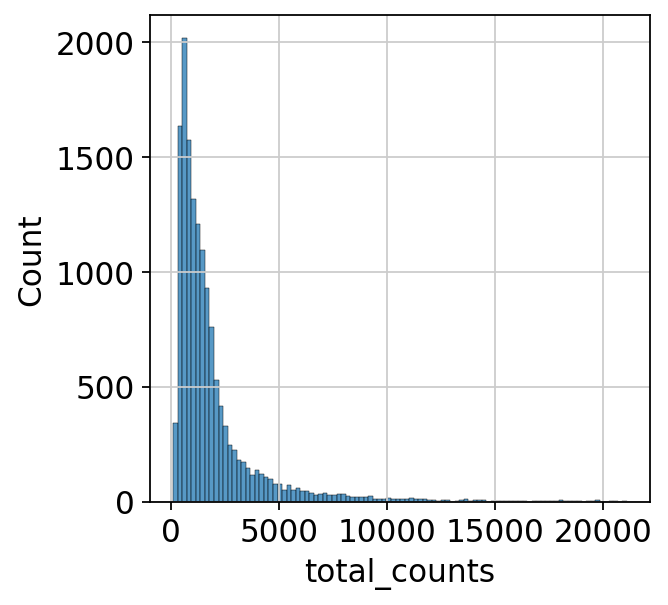

In [25]:
# distribution of raw counts
p1 = sns.histplot(adata.obs["total_counts"], bins=100, kde=False)

In [26]:
# shifted logarithm
scales_counts = sc.pp.normalize_total(adata, target_sum=None, inplace=False)
# log1p transform
adata.layers["log1p_norm"] = sc.pp.log1p(scales_counts["X"], copy=True)

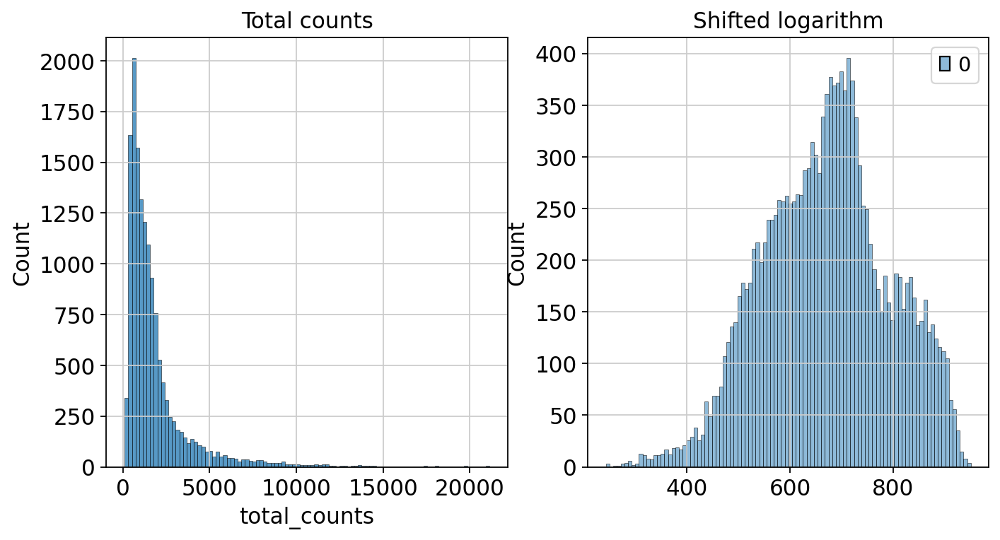

In [27]:
# inspect how count distribution changes
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
p1 = sns.histplot(adata.obs["total_counts"], bins=100, kde=False, ax=axes[0])
axes[0].set_title("Total counts")
p2 = sns.histplot(adata.layers["log1p_norm"].sum(1), bins=100, kde=False, ax=axes[1])
axes[1].set_title("Shifted logarithm")
plt.show()

In [28]:
# Scran’s pooling-based size factor estimation method
# Scran leverages a deconvolution approach to estimate the size factors based on a linear regression over genes for pools of cells. 
# This approach aims to better account for differences in count depths across all cells present in the dataset.
from scipy.sparse import csr_matrix, issparse

In [12]:
%%R
library(scran)
library(BiocParallel)

RRuntimeError: Error in (function (filename = "Rplot%03d.png", width = 480, height = 480,  : 
  Graphics API version mismatch


In [29]:
# Preliminary clustering for differentiated normalisation
adata_pp = adata.copy()
sc.pp.normalize_total(adata_pp)
sc.pp.log1p(adata_pp)
sc.pp.pca(adata_pp, n_comps=15)
sc.pp.neighbors(adata_pp)
sc.tl.leiden(adata_pp, key_added="groups")

In [30]:
data_mat = adata_pp.X.T
# convert to CSC if possible. See https://github.com/MarioniLab/scran/issues/70
if issparse(data_mat):
    if data_mat.nnz > 2**31 - 1:
        data_mat = data_mat.tocoo()
    else:
        data_mat = data_mat.tocsc()
ro.globalenv["data_mat"] = data_mat
ro.globalenv["input_groups"] = adata_pp.obs["groups"]

In [31]:
del adata_pp

In [16]:
%%R -o size_factors

size_factors = sizeFactors(
    computeSumFactors(
        SingleCellExperiment(
            list(counts=data_mat)), 
            clusters = input_groups,
            min.mean = 0.1,
            BPPARAM = MulticoreParam()
    )
)

RRuntimeError: Error in (function (filename = "Rplot%03d.png", width = 480, height = 480,  : 
  Graphics API version mismatch


In [17]:
adata.obs["size_factors"] = size_factors
scran = adata.X / adata.obs["size_factors"].values[:, None]
adata.layers["scran_normalization"] = csr_matrix(sc.pp.log1p(scran))

NameError: name 'size_factors' is not defined

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
p1 = sns.histplot(adata.obs["total_counts"], bins=100, kde=False, ax=axes[0])
axes[0].set_title("Total counts")
p2 = sns.histplot(
    adata.layers["scran_normalization"].sum(1), bins=100, kde=False, ax=axes[1]
)
axes[1].set_title("log1p with Scran estimated size factors")
plt.show()

# Analytic Pearson residuals
### motivated by the observation that cell-to-cell variation in scRNA-seq data might be confounded by biological heterogeneity 
### with technical effects. The method utilizes Pearson residuals from ‘regularized negative binomial regression’ to calculate 
### a model of technical noise in the data. It adds the count depth as a covariate in a generalized linear model. 
### This method removed the impact of sampling effects while preserving cell heterogeneity in the dataset. 
### Pearson residuals do not require downstream heuristic steps like pseudo count addition or log-transformation.​
### The output of this method are normalized values that can be positive or negative. Negative residuals for a cell and gene 
### indicate that less counts are observed than expected compared to the gene’s average expression and cellular sequencing depth. 
### Positive residuals indicate the more counts respectively

In [32]:
analytic_pearson = sc.experimental.pp.normalize_pearson_residuals(adata, inplace=False)
adata.layers["analytic_pearson_residuals"] = csr_matrix(analytic_pearson["X"])

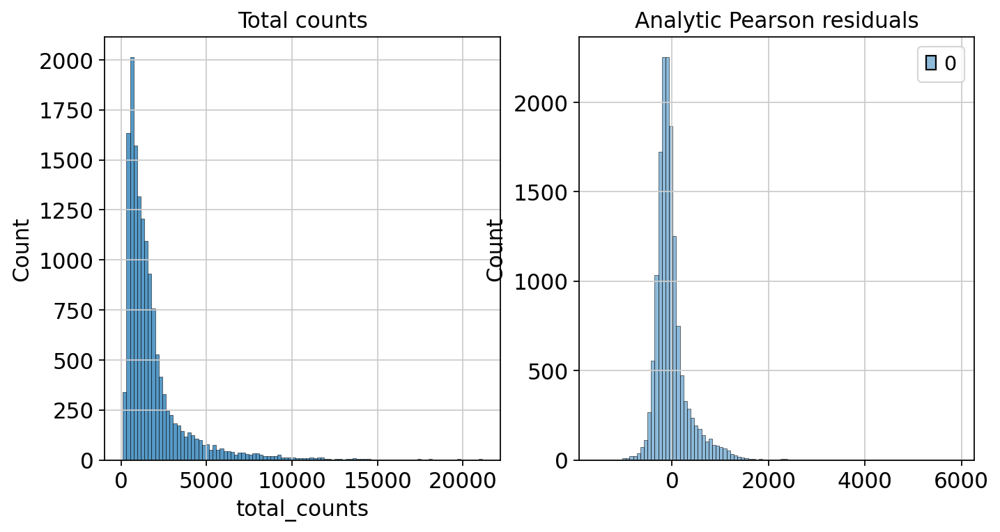

In [33]:
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
p1 = sns.histplot(adata.obs["total_counts"], bins=100, kde=False, ax=axes[0])
axes[0].set_title("Total counts")
p2 = sns.histplot(
    adata.layers["analytic_pearson_residuals"].sum(1), bins=100, kde=False, ax=axes[1]
)
axes[1].set_title("Analytic Pearson residuals")
plt.show()

In [34]:
# write out the data
adata.write("s4d8_normalization.h5ad")

# Feature selection
### scry in R use deviance for feature selection which works on raw counts
#### Deviance can be computed in closed form and quantifies whether genes show a constant expression profile across cells as these are not informative. Genes with constant expression are described by a multinomial null model, they are approximated by the binomial deviance. Highly informative genes across cells will have a high deviance value which indicates a poor fit by the null model

In [35]:
import scanpy as sc
import anndata2ri
import logging
import numpy as np

import rpy2.rinterface_lib.callbacks as rcb
import rpy2.robjects as ro

sc.settings.verbosity = 0
sc.settings.set_figure_params(
    dpi=80,
    facecolor="white",
    frameon=False,
)

rcb.logger.setLevel(logging.ERROR)
ro.pandas2ri.activate()
anndata2ri.activate()

%load_ext rpy2.ipython

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [36]:
%reload_ext rpy2.ipython

In [37]:
%%R
library(scry)

RRuntimeError: Error in (function (filename = "Rplot%03d.png", width = 480, height = 480,  : 
  Graphics API version mismatch


In [38]:
# load normalized data.. deviance is calculated on raw counts, but this is in the normalized data set
adata = sc.read(
    filename="s4d8_normalization.h5ad",
    backup_url="https://figshare.com/ndownloader/files/40015741",
)

# feature selection with deviance on non-normalized counts

In [39]:
%%R
sce = devianceFeatureSelection(adata, assay="X")

RRuntimeError: Error in (function (filename = "Rplot%03d.png", width = 480, height = 480,  : 
  Graphics API version mismatch


In [40]:
binomial_deviance = ro.r("rowData(sce)$binomial_deviance").T

RRuntimeError: Error in rowData(sce) : could not find function "rowData"


In [41]:
idx = binomial_deviance.argsort()[-4000:]
mask = np.zeros(adata.var_names.shape, dtype=bool)
mask[idx] = True

adata.var["highly_deviant"] = mask
adata.var["binomial_deviance"] = binomial_deviance

NameError: name 'binomial_deviance' is not defined

In [42]:
adata.write("s4d8_feature_selection.h5ad")

# Dimensionality reduction
### Not all genes are informative and are important for the task of cell type clustering based on their expression profiles. We already aimed to reduce the dimensionality of the data with feature selection, as a next step one can further reduce the dimensions of single-cell RNA-seq data with dimensionality reduction algorithms. These algorithms are an important step during preprocessing to reduce the data complexity and for visualization.
###  t-distributed stochastic neighbor embedding (t-SNE) as it yielded the best overall performance. Uniform manifold approximation and projection (UMAP) showed the highest stability and separates best the original cell populations. 

In [43]:
import scanpy as sc

sc.settings.verbosity = 0
sc.settings.set_figure_params(
    dpi=80,
    facecolor="white",
    frameon=False,
)

In [44]:
adata = sc.read(
    filename="s4d8_feature_selection.h5ad",
    backup_url="https://figshare.com/ndownloader/files/40016014",
)

In [45]:
# use normalized representation of the data set for dim reduction, shifted logrithm
adata.X = adata.layers["log1p_norm"]

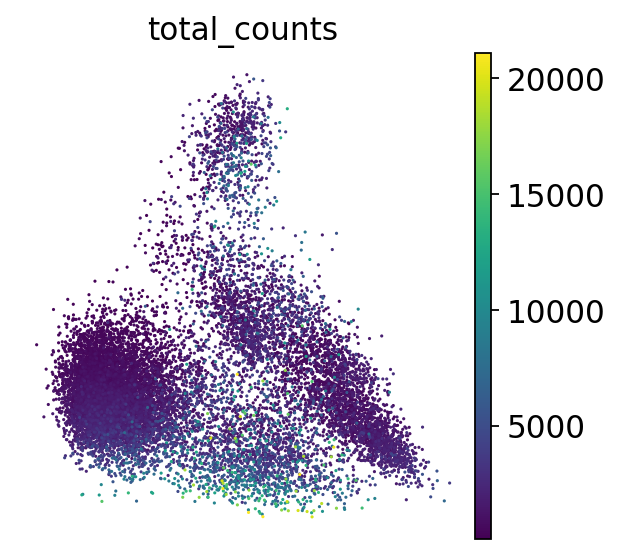

In [50]:
# do PCA
# because data are sparse and nonlinear, PCA is typically used to select the top 10-50 PCs which are used for downstream analysis tasks.
# setting highly variable as highly deviant to use scanpy 'use_highly_variable' argument in sc.pp.pca
 # adata.var["highly_variable"] = adata.var["highly_deviant"] # commenting this out because could not get hgihly deivant genes
sc.pp.pca(adata, svd_solver="arpack") # use_highly_variable=True)
sc.pl.pca_scatter(adata, color="total_counts")

# t-SNE
### t-SNE is a graph based, non-linear dimensionality reduction technique which projects the high dimensional data onto 2D or 3D components. The method defines a Gaussian probability distribution based on the high-dimensional Euclidean distances between data points. Subsequently, a Student t-distribution is used to recreate the probability distribution in a low dimensional space where the embeddings are optimized using gradient descent.

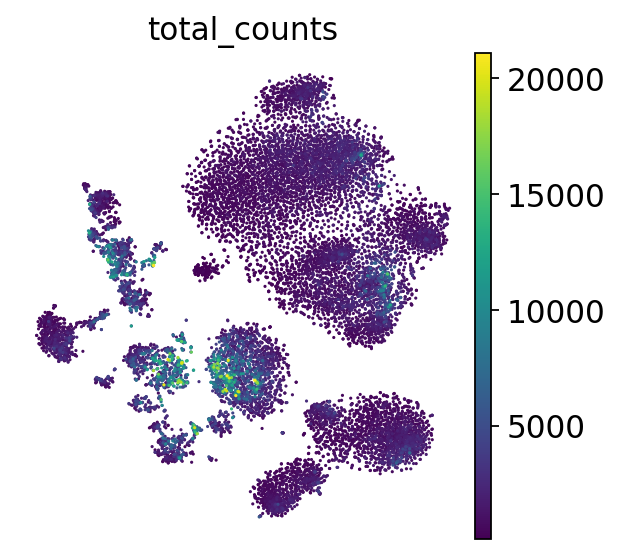

In [51]:
sc.tl.tsne(adata, use_rep="X_pca")
sc.pl.tsne(adata, color="total_counts")

# UMAP
### UMAP is a graph based, non-linear dimensionality technique and principally similar to t-SNE. It constructs a high dimensional graph representation of the dataset and optimizes the low-dimensional graph representation to be structurally as similar as possible to the original graph.

#### We first calculate PCA and subsequently a neighborhood graph on our data.

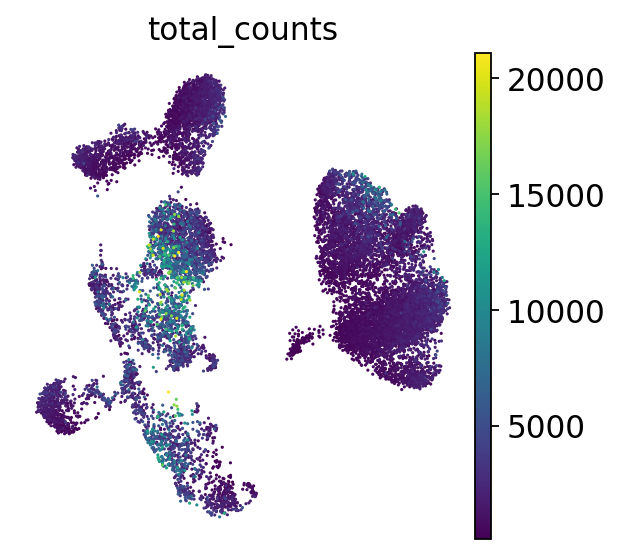

In [52]:
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.pl.umap(adata, color="total_counts")

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


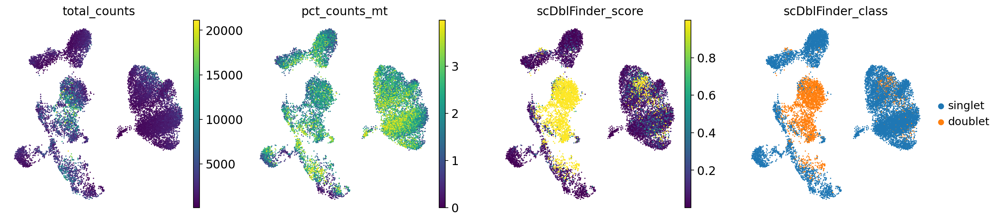

In [53]:
# Inspecting quality control metrics
sc.pl.umap(
    adata,
    color=["total_counts", "pct_counts_mt", "scDblFinder_score", "scDblFinder_class"],
)

In [54]:
adata.write("s4d8_dimensionality_reduction.h5ad")

# Clustering

### We structure cells into clusters to infer the identity of similar cells. Clustering itself is a common unsupervised machine learning problem. We can derive clusters by minimizing the intra-cluster distance in the reduced expression space. In this case, the expression space determines the gene expression similarity of cells with respect to a dimensionality-reduced representation. This lower dimensional representation is, for example, determined with a principle-component analysis and the similarity scoring is then based on Euclidean distances

### n the KNN graph consists of nodes reflecting the cells in the dataset. We first calculate a Euclidean distance matrix on the PC-reduced expression space for all cells and then connect each cell to its K most similar cells. Usually, K is set to values between 5 and 100 depending on the size of the dataset. The KNN graph reflects the underlying topology of the expression data by representing dense regions with respect to expression space also as densely connected regions in the graph [Wolf et al., 2019]. Dense regions in the KNN-graph are detected by community detection methods like Leiden 

### The Leiden algorithm is as an improved version of the Louvain algorithm which outperformed other clustering methods for single-cell RNA-seq data analysis. Leiden creates clusters by taking into account the number of links between cells in a cluster versus the overall expected number of links in the dataset. The starting point is a singleton partition in which each node functions as its own community (a). As a next step, the algorithm creates partitions by moving individual nodes from one community to another (b), which is refined afterwards to enhance the partitioning (c). The refined partition is then aggregated to a network (d). Subsequently, the algorithm moves again individual nodes in the aggregate network (e), until refinement does no longer change the partition (f). All steps are repeated until the final clustering is created and partitions no longer change.

### The Leiden module has a resolution parameter which allows to determine the scale of the partition cluster and therefore the coarseness of the clustering. A higher resolution parameter leads to more clusters. The algorithm additionally allows efficient sub-clustering of particular clusters in the dataset by sub-setting the KNN graph. Sub-clustering enables the user to identify cell-type specific states within clusters or a finer cell type labeling[Wagner et al., 2016], but can also lead to patterns that are only due to noise present in the data.

In [55]:
import scanpy as sc

sc.settings.verbosity = 0
sc.settings.set_figure_params(dpi=80, facecolor="white", frameon=False)

In [57]:
# load the dataset
# adata = sc.read("s4d8_subset_gex.h5ad")

In [58]:
adata

AnnData object with n_obs × n_vars = 14814 × 20171
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'scDblFinder_score', 'scDblFinder_class'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'pca', 'tsne', 'neighbors', 'umap', 'scDblFinder_class_colors'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    layers: 'analytic_pearson_residuals', 'counts', 'log1p_norm', 'soupX_counts'
    obsp: 'distances', 'connectivities'

In [59]:
sc.pp.neighbors(adata, n_pcs=30)
sc.tl.umap(adata)

In [60]:
# call leiden algorithm
sc.tl.leiden(adata)

In [62]:
# default resolution parameter in scanpy is 1.0, but good to try different resoltions for your data
sc.tl.leiden(adata, key_added="leiden_res0_25", resolution=0.25)
sc.tl.leiden(adata, key_added="leiden_res0_5", resolution=0.5)
sc.tl.leiden(adata, key_added="leiden_res1", resolution=1.0)

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


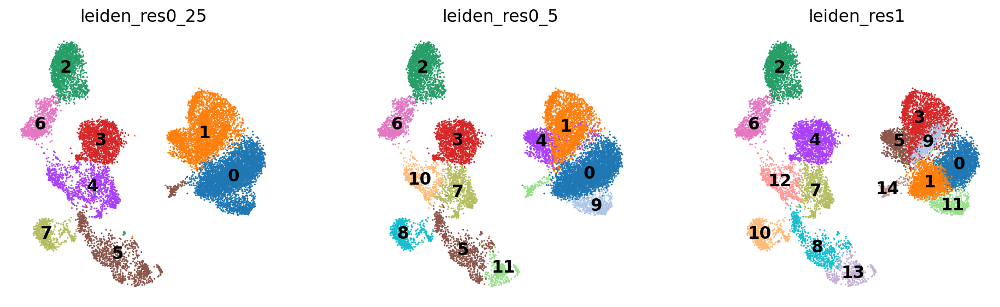

In [63]:
# visualize
sc.pl.umap(
    adata,
    color=["leiden_res0_25", "leiden_res0_5", "leiden_res1"],
    legend_loc="on data",
)

In [68]:
# write clustering
adata.write("s4d8_clustered.h5ad")

# Annotation

### to figure out the “cellular identity” of each of the cells in your data. The process of labeling groups of cells in your data based on known (or sometimes unknown) cellular phenotypes is called “cell annotation”.

### what is a cell type? Biologists use the term cell type to denote a cellular phenotype that is robust across datasets, identifiable based on expression of specific markers (i.e. proteins or gene transcripts), and often linked to specific functions. For example, a plasma B cell is a type of white blood cell that secretes antibodies used to fight pathogens and it can be identified using specific markers. Knowing which cell types are in your sample is essential in understanding your data. 

### However, like with any categorization the size of categories and the borders drawn between them are partly subjective and can change over time, e.g. because new technologies allow for a higher resolution view of cells, or because specific “sub-phenotypes” that were not considered biologically meaningful are found to have important biological implications (see e.g. [Kadur Lakshminarasimha Murthy et al., 2022]). Cell types are therefore often further classified into “subtypes” or “cell states” (e.g. activated versus resting) and some researchers use the term “cell identity” to avoid this sometimes arbitrary distinction of cell types, cell subtypes and cell states. Also multiple cell types can be part of a single continuum, where one cell type might transition or differentiate into another. 

In [2]:
# filter out warnings
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [4]:
# load modules
import scanpy as sc
import pandas as pd
import numpy as np
import os
from scipy.sparse import csr_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import celltypist
from celltypist import models
import scvi

Created a temporary directory at /tmp/tmpxktqsf2f
Writing /tmp/tmpxktqsf2f/_remote_module_non_scriptable.py
Global seed set to 0


In [5]:
warnings.filterwarnings("ignore", category=pd.errors.PerformanceWarning)

In [6]:
# preprocessed data set
path_query_data = "./s4d8_clustered.h5ad"
dir_reference_model = "./scvi_reference_model"
path_annotations = "./cell_type_annotations.csv"

In [7]:
# set figure parameters
sc.set_figure_params(figsize=(5, 5))

In [13]:
# read in data set as AnnData object
adata = sc.read_h5ad(path_query_data)
# we only anotate a single sample
# adata = adata_complete[adata_complete.obs["sample"] == "site4-donor8", :].copy()

In [14]:
adata

AnnData object with n_obs × n_vars = 14814 × 20171
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'scDblFinder_score', 'scDblFinder_class', 'leiden', 'leiden_res0_25', 'leiden_res0_5', 'leiden_res1'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'leiden', 'leiden_res0_25_colors', 'leiden_res0_5_colors', 'leiden_res1_colors', 'neighbors', 'pca', 'scDblFinder_class_colors', 'tsne', 'umap'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    layers: 'analytic_pearson_residuals', 'counts', 'log1p_norm', 'soupX_counts'
    obsp: 'connectiviti

In [10]:
# read in annotation daya
ct_annotations = pd.read_csv(path_annotations, index_col=0)
# compare adata to annotation
ct_annotations.head(3)
adata.obs.head(3)
# remove suffices from Adata object
adata.obs.index = [x.split("-14-12")[0] for x in adata.obs.index]
# subset adata to cells that pass qc
adata = adata[ct_annotations.index, :].copy()

FileNotFoundError: [Errno 2] No such file or directory: './cell_type_annotations.csv'

# Manual annotation

## perform cell type annotation is based on a single or small set of marker genes known to be associated with a particular cell type

### data is often clustered before annotation, so that we can annotate groups of cells instead of making a per-cell call.
### two options for marker-gene annotation:
### 1. work from a table of marker genes for all the cell types you expect in your data and check in which those clusters are expressed
### 2. check which genes are highly expressed in the clusters you defined and then check if they are associated with known cell types or states

In [11]:
# working with known list of markers
marker_genes = {
    "CD14+ Mono": ["FCN1", "CD14"],
    "CD16+ Mono": ["TCF7L2", "FCGR3A", "LYN"],
    "ID2-hi myeloid prog": [
        "CD14",
        "ID2",
        "VCAN",
        "S100A9",
        "CLEC12A",
        "KLF4",
        "PLAUR",
    ],
    "cDC1": ["CLEC9A", "CADM1"],
    "cDC2": [
        "CST3",
        "COTL1",
        "LYZ",
        "DMXL2",
        "CLEC10A",
        "FCER1A",
    ],  # Note: DMXL2 should be negative
    "Normoblast": ["SLC4A1", "SLC25A37", "HBB", "HBA2", "HBA1", "TFRC"],
    "Erythroblast": ["MKI67", "HBA1", "HBB"],
    "Proerythroblast": [
        "CDK6",
        "SYNGR1",
        "HBM",
        "GYPA",
    ],  # Note HBM and GYPA are negative markers
    "NK": ["GNLY", "NKG7", "CD247", "GRIK4", "FCER1G", "TYROBP", "KLRG1", "FCGR3A"],
    "ILC": ["ID2", "PLCG2", "GNLY", "SYNE1"],
    "Lymph prog": [
        "VPREB1",
        "MME",
        "EBF1",
        "SSBP2",
        "BACH2",
        "CD79B",
        "IGHM",
        "PAX5",
        "PRKCE",
        "DNTT",
        "IGLL1",
    ],
    "Naive CD20+ B": ["MS4A1", "IL4R", "IGHD", "FCRL1", "IGHM"],
    "B1 B": [
        "MS4A1",
        "SSPN",
        "ITGB1",
        "EPHA4",
        "COL4A4",
        "PRDM1",
        "IRF4",
        "CD38",
        "XBP1",
        "PAX5",
        "BCL11A",
        "BLK",
        "IGHD",
        "IGHM",
        "ZNF215",
    ],  # Note IGHD and IGHM are negative markers
    "Transitional B": ["MME", "CD38", "CD24", "ACSM3", "MSI2"],
    "Plasma cells": ["MZB1", "HSP90B1", "FNDC3B", "PRDM1", "IGKC", "JCHAIN"],
    "Plasmablast": ["XBP1", "RF4", "PRDM1", "PAX5"],  # Note PAX5 is a negative marker
    "CD4+ T activated": ["CD4", "IL7R", "TRBC2", "ITGB1"],
    "CD4+ T naive": ["CD4", "IL7R", "TRBC2", "CCR7"],
    "CD8+ T": ["CD8A", "CD8B", "GZMK", "GZMA", "CCL5", "GZMB", "GZMH", "GZMA"],
    "T activation": ["CD69", "CD38"],  # CD69 much better marker!
    "T naive": ["LEF1", "CCR7", "TCF7"],
    "pDC": ["GZMB", "IL3RA", "COBLL1", "TCF4"],
    "G/M prog": ["MPO", "BCL2", "KCNQ5", "CSF3R"],
    "HSC": ["NRIP1", "MECOM", "PROM1", "NKAIN2", "CD34"],
    "MK/E prog": [
        "ZNF385D",
        "ITGA2B",
        "RYR3",
        "PLCB1",
    ],  # Note PLCB1 is a negative marker
}

In [15]:
# Subset to only the markers that were detected in our data
marker_genes_in_data = dict()
for ct, markers in marker_genes.items():
    markers_found = list()
    for marker in markers:
        if marker in adata.var.index:
            markers_found.append(marker)
    marker_genes_in_data[ct] = markers_found

In [16]:
# We’ll construct that UMAP here based on the scran-normalized count data, using only the highly deviant genes. Note that we first perform a PCA on the normalized counts to reduce dimensionality of the data before we generate the UMAP.
adata.layers["counts"] = adata.X
# I used log1p_norm since scran_normalization didn't run due to R-py issues
adata.X = adata.layers["log1p_norm"]

In [17]:
# adata.var["highly_variable"] = adata.var["highly_deviant"]
adata.var

,gene_ids,feature_types,genome,mt,ribo,hb,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,n_cells
AL627309.1,ENSG00000238009,Gene Expression,GRCh38,False,False,False,30,0.001831,0.001829,99.822842,31.0,3.465736,27
AL627309.5,ENSG00000241860,Gene Expression,GRCh38,False,False,False,146,0.008976,0.008936,99.137829,152.0,5.030438,126
LINC01409,ENSG00000237491,Gene Expression,GRCh38,False,False,False,883,0.063009,0.061104,94.785638,1067.0,6.973543,758
LINC01128,ENSG00000228794,Gene Expression,GRCh38,False,False,False,533,0.036140,0.035503,96.852486,612.0,6.418365,437
LINC00115,ENSG00000225880,Gene Expression,GRCh38,False,False,False,72,0.004370,0.004360,99.574820,74.0,4.317488,64
...,...,...,...,...,...,...,...,...,...,...,...,...,...
AC011043.1,ENSG00000276256,Gene Expression,GRCh38,False,False,False,134,0.008740,0.008702,99.208693,148.0,5.003946,104
AL354822.1,ENSG00000278384,Gene Expression,GRCh38,False,False,False,82,0.005256,0.005242,99.515767,89.0,4.499810,66
AL592183.1,ENSG00000273748,Gene Expression,GRCh38,False,False,False,1291,0.111433,0.105650,92.376284,1887.0,7.543273,1115
AC240274.1,ENSG00000271254,Gene Expression,GRCh38,False,False,False,300,0.019015,0.018836,98.228416,322.0,5.777652,262


In [18]:
# perform PCA
# couldn't caluclte deviuance, so omitting highly variable genes option
sc.tl.pca(adata, n_comps=50) # use_highly_variable=True)

In [19]:
# Calculate the neighbor graph based on the PCs
sc.pp.neighbors(adata)
# calculate a 2-dimensional UMAP embedding of the data
sc.tl.umap(adata)

In [20]:
# show expression of the markers using the calculated UMAP. We’ll limit ourselves to B/plasma cell subtypes
# list the B cell subtypes
B_plasma_cts = [
    "Naive CD20+ B",
    "B1 B",
    "Transitional B",
    "Plasma cells",
    "Plasmablast",
]

NAIVE CD20+ B:


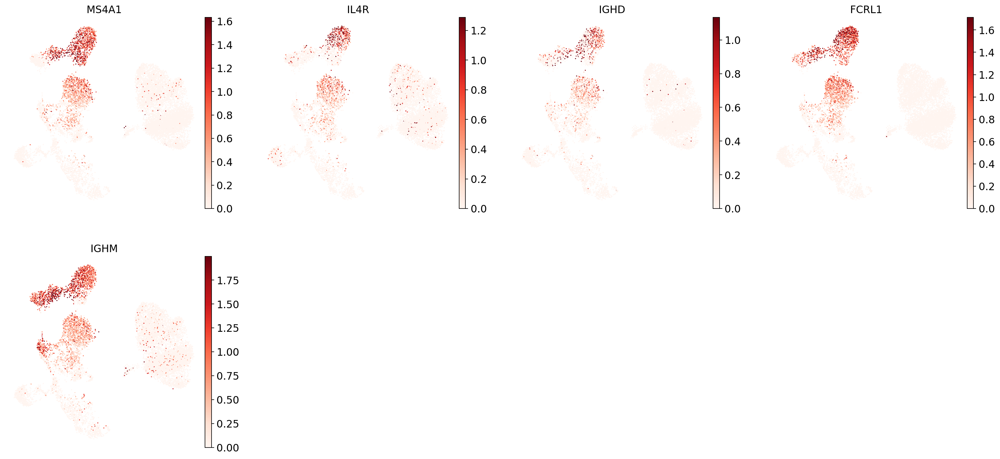





B1 B:


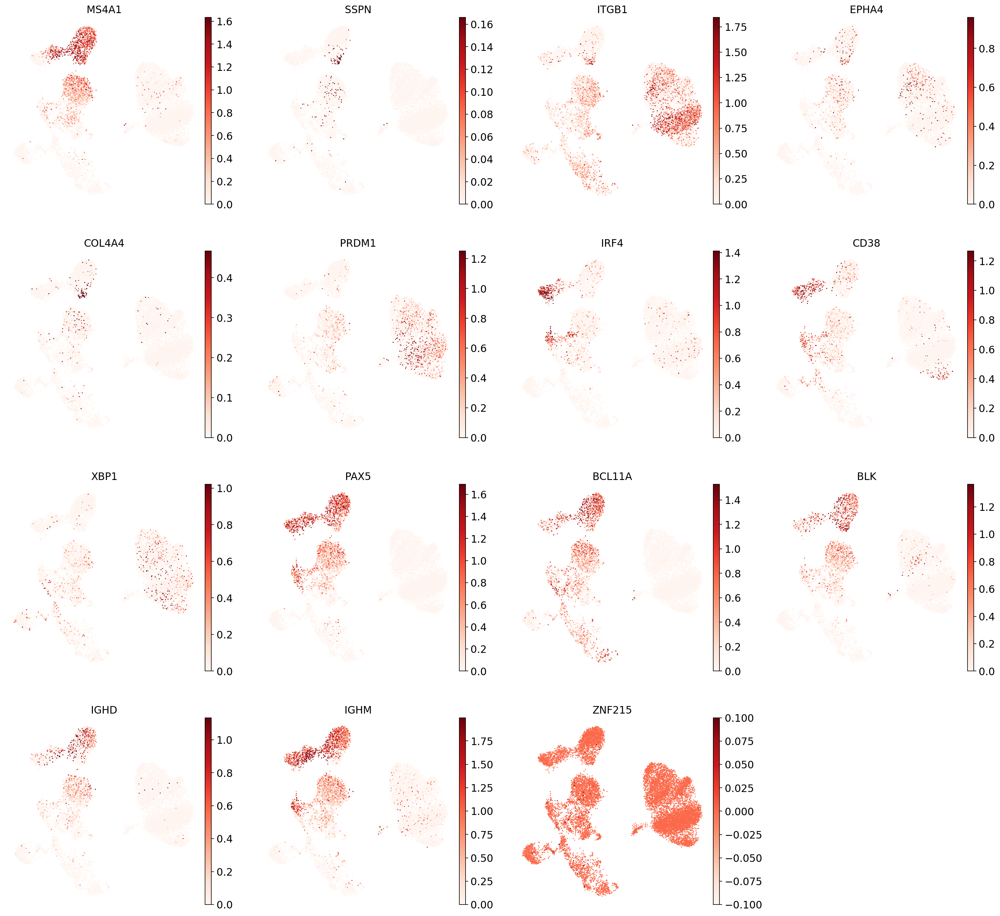





TRANSITIONAL B:


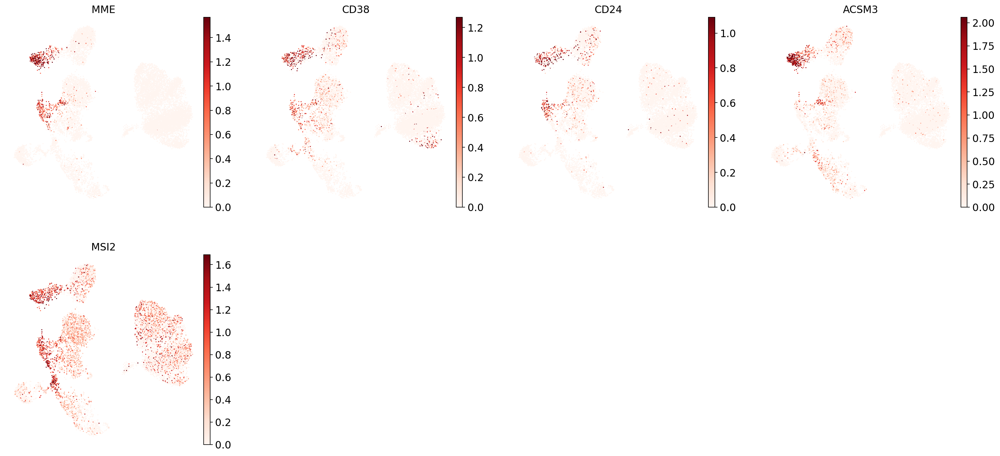





PLASMA CELLS:


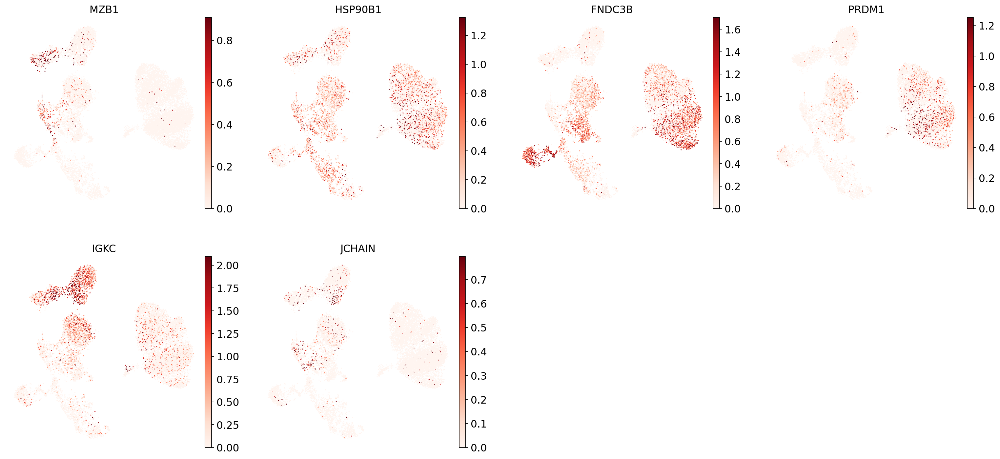





PLASMABLAST:


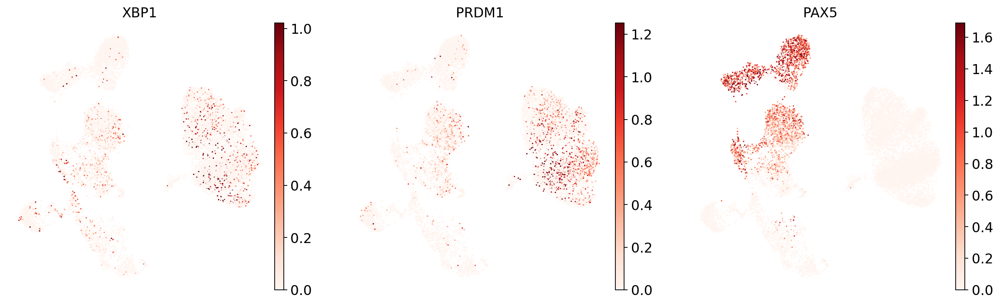

In [21]:
# now plot one UMAP per marker for each of the B cell subtypes
for ct in B_plasma_cts:
    print(f"{ct.upper()}:")  # print cell subtype name
    sc.pl.umap(
        adata,
        color=marker_genes_in_data[ct],
        vmin=0,
        vmax="p99",  # set vmax to the 99th percentile of the gene count instead of the maximum, to prevent outliers from making expression in other cells invisible. Note that this can cause problems for extremely lowly expressed genes.
        sort_order=False,  # do not plot highest expression on top, to not get a biased view of the mean expression among cells
        frameon=False,
        cmap="Reds",  # or choose another color map e.g. from here: https://matplotlib.org/stable/tutorials/colors/colormaps.html
    )
    print("\n\n\n")  # print white space for legibility

In [22]:
# cluster data to better annotate
sc.tl.leiden(adata, resolution=1, key_added="leiden_1")

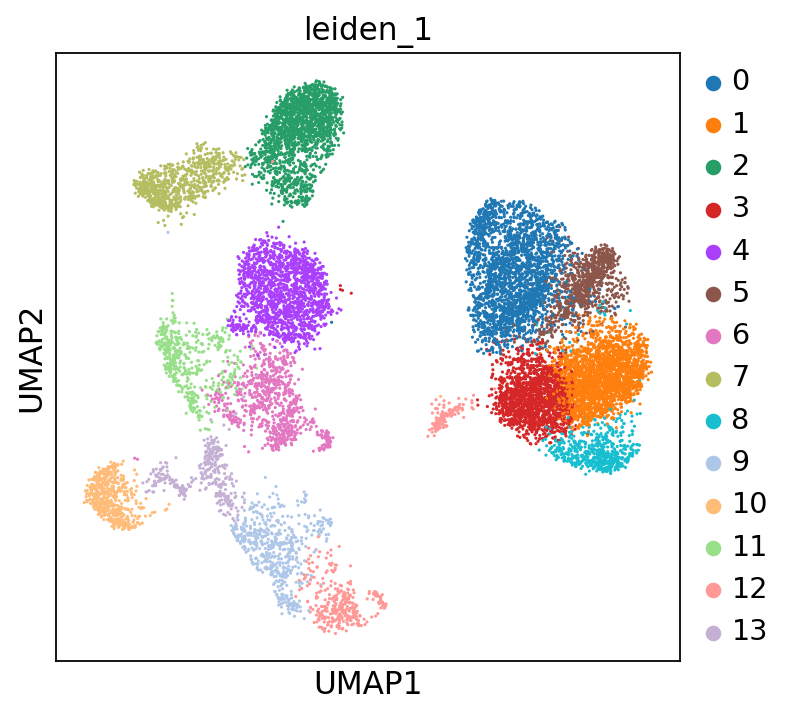

In [23]:
sc.pl.umap(adata, color="leiden_1")

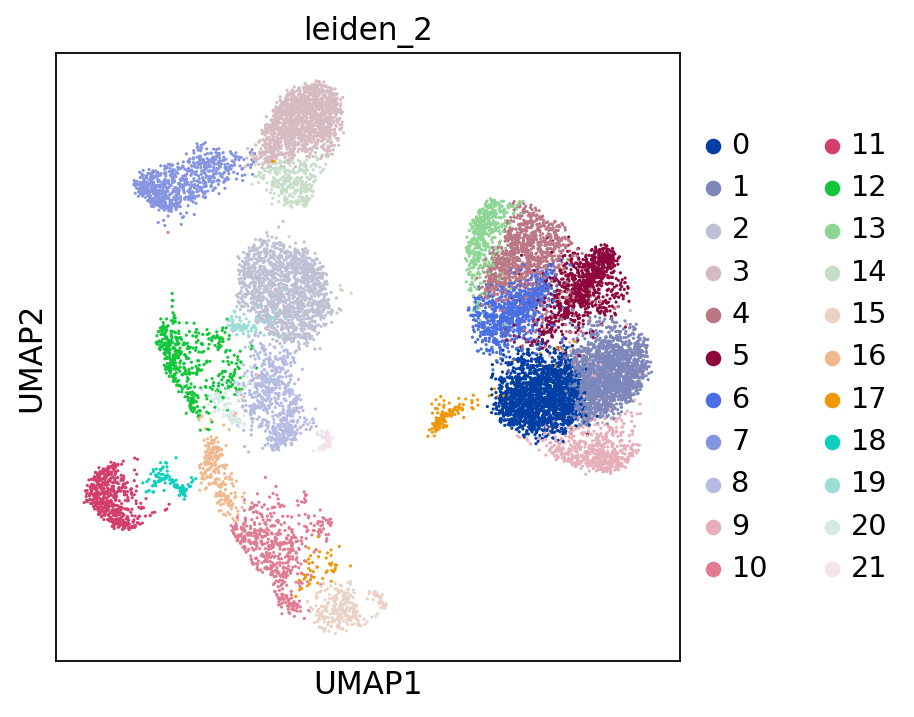

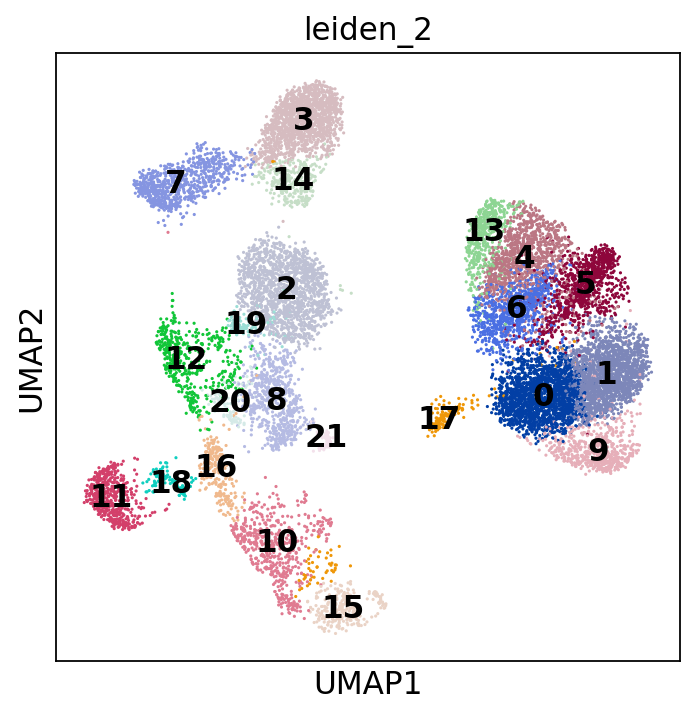

In [27]:
# finer resolution:
sc.tl.leiden(adata, resolution=2, key_added="leiden_2")
sc.pl.umap(adata, color="leiden_2")
sc.pl.umap(adata, color="leiden_2", legend_loc="on data")

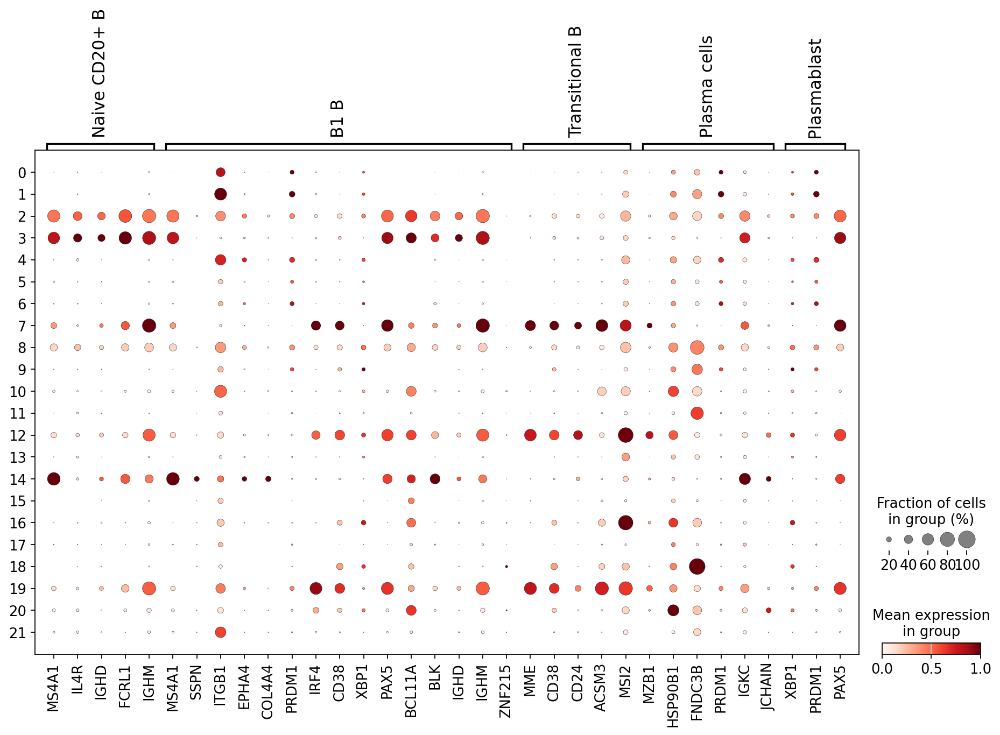

In [26]:
# visualize Naive CD20+ B cell markers expression via dotplot
B_plasma_markers = {
    ct: [m for m in ct_markers if m in adata.var.index]
    for ct, ct_markers in marker_genes.items()
    if ct in B_plasma_cts
}
sc.pl.dotplot(
    adata,
    groupby="leiden_2",
    var_names=B_plasma_markers,
    standard_scale="var",  # standard scale: normalize each gene to range from 0 to 1
)

In [57]:
# Naive CD20+ B cell markers consitent in clusters 2 and 3
# note 19 could be B1 or transtional B, we'll annotate as transitional
cl_annotation = {
    "2": "Naive CD20+ B",
    "3": "Naive CD20+ B",
    "12": "Transitional B",
    "19": "Transitional B",
    "7": "B1 B",  # note that IGHD and IGHM are negative markers, in this case more lowly expressed than in the other B cell clusters
}

In [58]:
# visualize
adata.obs["manual_celltype_annotation"] = adata.obs.leiden_2.map(cl_annotation)

... storing 'manual_celltype_annotation' as categorical


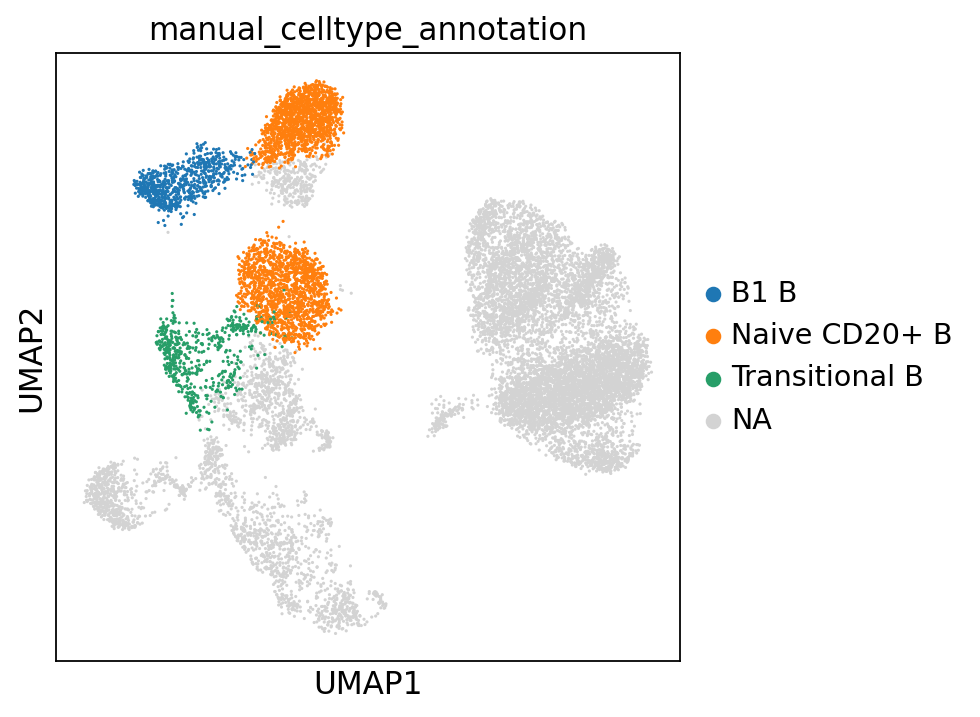

In [59]:
sc.pl.umap(adata, color=["manual_celltype_annotation"])

## cluster DE gene annotation

In [31]:
# calculate DE genes for every cluster;
sc.tl.rank_genes_groups(
    adata, groupby="leiden_2", method="wilcoxon", key_added="dea_leiden_2"
)

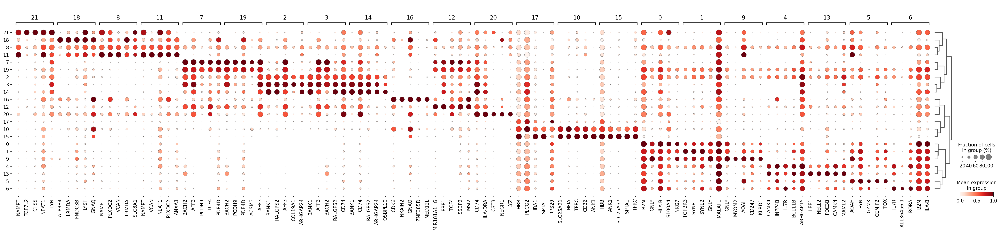

In [32]:
sc.pl.rank_genes_groups_dotplot(
    adata, groupby="leiden_2", standard_scale="var", n_genes=5, key="dea_leiden_2"
)

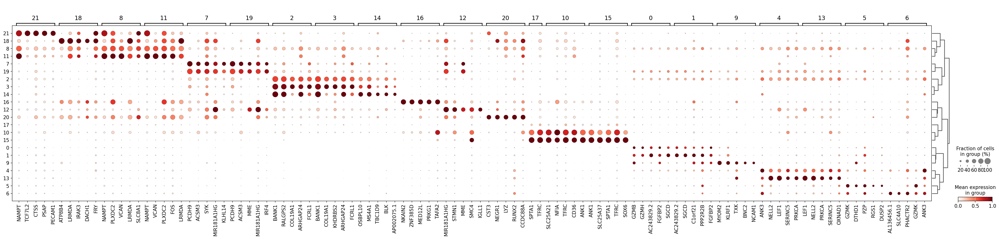

In [33]:
# filter the differentially expressed genes to select for more cluster-specific differentially expressed genes
sc.tl.filter_rank_genes_groups(
    adata,
    min_in_group_fraction=0.2,
    max_out_group_fraction=0.2,
    key="dea_leiden_2",
    key_added="dea_leiden_2_filtered",
)
# plot
sc.pl.rank_genes_groups_dotplot(
    adata,
    groupby="leiden_2",
    standard_scale="var",
    n_genes=5,
    key="dea_leiden_2_filtered",
)

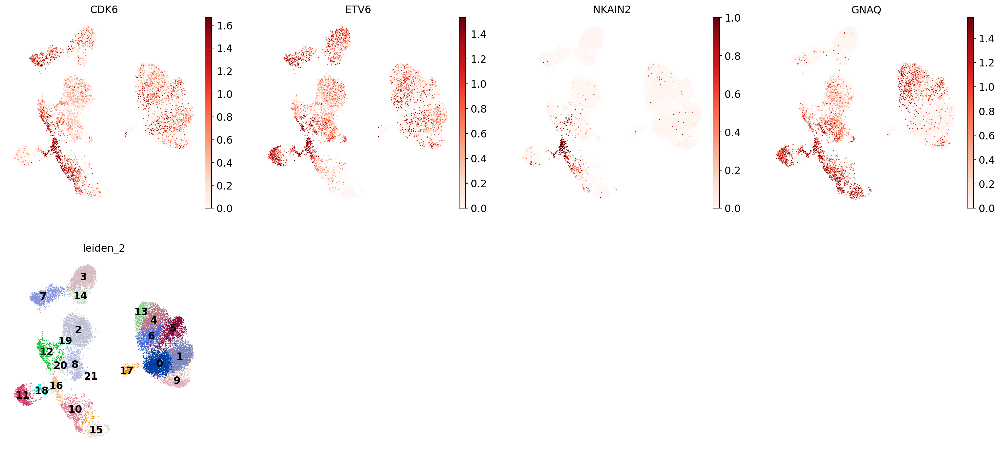

In [34]:
# take a look at cluster 16 with relatively unique markers CDK6, ETV6, NKAIN2, GNAQ and ZNF385D- note this is from tutorial and different in this data because some of the steps were omitted
sc.pl.umap(
    adata,
    color=["CDK6", "ETV6", "NKAIN2", "GNAQ", "leiden_2"],
    vmax="p99",
    legend_loc="on data",
    frameon=False,
    cmap="Reds",
)

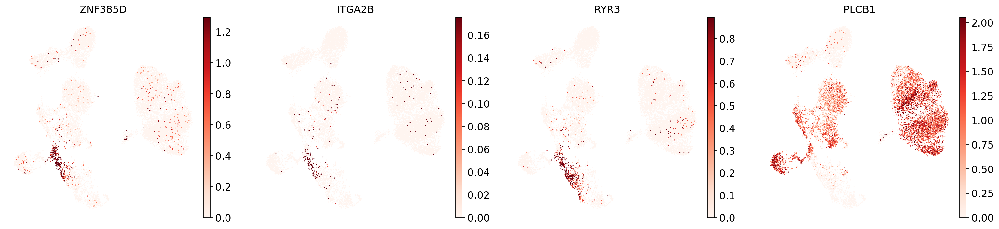

In [35]:
# However, looking at the known markers for the megakaryocyte/erythrocyte progenitors (“MK/E prog”), we see that part of cluster 13 seems to belong to that cell type:
sc.pl.umap(
    adata,
    color=[
        "ZNF385D",
        "ITGA2B",
        "RYR3",
        "PLCB1",
    ],
    vmax="p99",
    legend_loc="on data",
    frameon=False,
    cmap="Reds",
)

In [60]:
# store annotation data
cl_annotation["16"] = "HSCs + MK/E prog (?)"
adata.obs["manual_celltype_annotation"] = adata.obs.leiden_2.map(cl_annotation)

# Automated annotation

### varies based on:
### 1. type of classifier
### 2. quality of training data
### 3. similarity to your own data

###  trying CellTypist (https://www.celltypist.org/tutorials)

In [37]:
adata_celltypist = adata.copy()  # make a copy of our adata
adata_celltypist.X = adata.layers["counts"]  # set adata.X to raw counts
sc.pp.normalize_per_cell(
    adata_celltypist, counts_per_cell_after=10**4
)  # normalize to 10,000 counts per cell
sc.pp.log1p(adata_celltypist)  # log-transform
# make .X dense instead of sparse, for compatibility with celltypist:
adata_celltypist.X = adata_celltypist.X.toarray()

In [38]:
# download models
models.download_models(
    force_update=True, model=["Immune_All_Low.pkl", "Immune_All_High.pkl"]
)

📜 Retrieving model list from server https://celltypist.cog.sanger.ac.uk/models/models.json
📚 Total models in list: 19
📂 Storing models in /w5home/bmoore/.celltypist/data/models
💾 Total models to download: 2
💾 Downloading model [1/2]: Immune_All_Low.pkl
💾 Downloading model [2/2]: Immune_All_High.pkl


In [39]:
# try the models
model_low = models.Model.load(model="Immune_All_Low.pkl")
model_high = models.Model.load(model="Immune_All_High.pkl")

In [40]:
model_high.cell_types

array(['B cells', 'B-cell lineage', 'Cycling cells', 'DC', 'DC precursor',
       'Double-negative thymocytes', 'Double-positive thymocytes', 'ETP',
       'Early MK', 'Endothelial cells', 'Epithelial cells',
       'Erythrocytes', 'Erythroid', 'Fibroblasts', 'Granulocytes',
       'HSC/MPP', 'ILC', 'ILC precursor', 'MNP', 'Macrophages',
       'Mast cells', 'Megakaryocyte precursor',
       'Megakaryocytes/platelets', 'Mono-mac', 'Monocyte precursor',
       'Monocytes', 'Myelocytes', 'Plasma cells', 'Promyelocytes',
       'T cells', 'pDC', 'pDC precursor'], dtype=object)

In [41]:
model_low.cell_types

array(['Age-associated B cells', 'Alveolar macrophages', 'B cells',
       'CD16+ NK cells', 'CD16- NK cells', 'CD8a/a', 'CD8a/b(entry)',
       'CMP', 'CRTAM+ gamma-delta T cells', 'Classical monocytes',
       'Cycling B cells', 'Cycling DCs', 'Cycling NK cells',
       'Cycling T cells', 'Cycling gamma-delta T cells',
       'Cycling monocytes', 'DC', 'DC precursor', 'DC1', 'DC2', 'DC3',
       'Double-negative thymocytes', 'Double-positive thymocytes', 'ELP',
       'ETP', 'Early MK', 'Early erythroid', 'Early lymphoid/T lymphoid',
       'Endothelial cells', 'Epithelial cells', 'Erythrocytes',
       'Erythrophagocytic macrophages', 'Fibroblasts',
       'Follicular B cells', 'Follicular helper T cells', 'GMP',
       'Germinal center B cells', 'Granulocytes', 'HSC/MPP',
       'Hofbauer cells', 'ILC', 'ILC precursor', 'ILC1', 'ILC2', 'ILC3',
       'Intermediate macrophages', 'Intestinal macrophages',
       'Kidney-resident macrophages', 'Kupffer cells',
       'Large pre-B cell

In [42]:
# run the models
predictions_high = celltypist.annotate(
    adata_celltypist, model=model_high, majority_voting=True
)

🔬 Input data has 14814 cells and 20171 genes
🔗 Matching reference genes in the model
🧬 5295 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 10
🗳️ Majority voting the predictions
✅ Majority voting done!


In [43]:
# transfer the predictions
predictions_high_adata = predictions_high.to_adata()

In [44]:
# copy the results to our original AnnData object
adata.obs["celltypist_cell_label_coarse"] = predictions_high_adata.obs.loc[
    adata.obs.index, "majority_voting"
]
adata.obs["celltypist_conf_score_coarse"] = predictions_high_adata.obs.loc[
    adata.obs.index, "conf_score"
]

In [45]:
# do finer annoations
predictions_low = celltypist.annotate(
    adata_celltypist, model=model_low, majority_voting=True
)

🔬 Input data has 14814 cells and 20171 genes
🔗 Matching reference genes in the model
🧬 5295 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Detected a neighborhood graph in the input object, will run over-clustering on the basis of it
⛓️ Over-clustering input data with resolution set to 10
🗳️ Majority voting the predictions
✅ Majority voting done!


In [46]:
predictions_low_adata = predictions_low.to_adata()
adata.obs["celltypist_cell_label_fine"] = predictions_low_adata.obs.loc[
    adata.obs.index, "majority_voting"
]
adata.obs["celltypist_conf_score_fine"] = predictions_low_adata.obs.loc[
    adata.obs.index, "conf_score"
]

... storing 'manual_celltype_annotation' as categorical


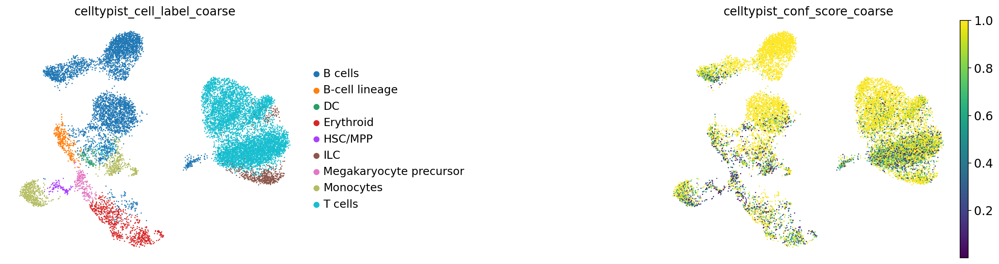

In [53]:
# plot
sc.pl.umap(
    adata,
    color=["celltypist_cell_label_coarse", "celltypist_conf_score_coarse"],
    frameon=False,
    sort_order=False,
    wspace=1,
)

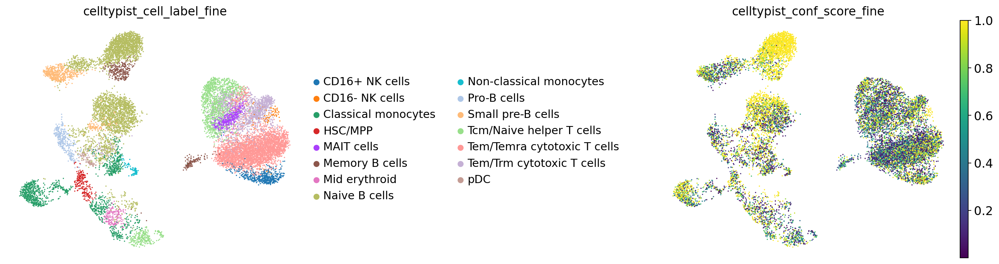

In [54]:
sc.pl.umap(
    adata,
    color=["celltypist_cell_label_fine", "celltypist_conf_score_fine"],
    frameon=False,
    sort_order=False,
    wspace=1,
)

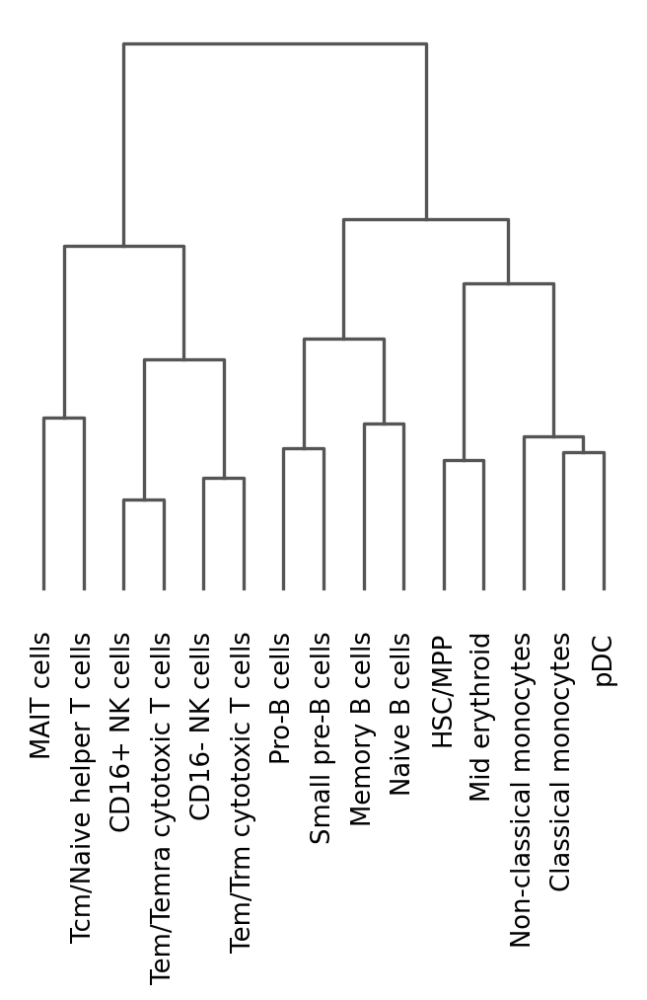

<Axes: >

In [49]:
# look at cell type similarities
sc.pl.dendrogram(adata, groupby="celltypist_cell_label_fine")

... storing 'manual_celltype_annotation' as categorical


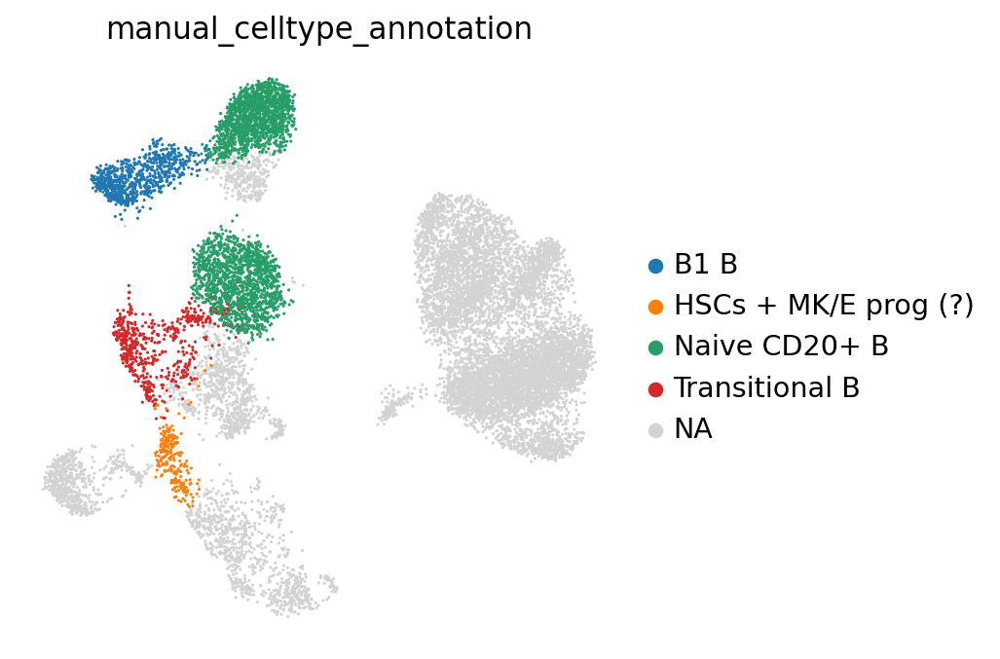

In [61]:
# manual annotation again
sc.pl.umap(
    adata,
    color=["manual_celltype_annotation"],
    frameon=False,
)

In [56]:
# breakdown of cluster 16 in terms of fine celltypist labels
pd.crosstab(adata.obs.leiden_2, adata.obs.celltypist_cell_label_fine).loc[
    "16", :
].sort_values(ascending=False)

celltypist_cell_label_fine
HSC/MPP                        218
Naive B cells                    8
Classical monocytes              3
CD16+ NK cells                   0
CD16- NK cells                   0
MAIT cells                       0
Memory B cells                   0
Mid erythroid                    0
Non-classical monocytes          0
Pro-B cells                      0
Small pre-B cells                0
Tcm/Naive helper T cells         0
Tem/Temra cytotoxic T cells      0
Tem/Trm cytotoxic T cells        0
pDC                              0
Name: 16, dtype: int64

In [62]:
# coarse cell typeist labels
pd.crosstab(adata.obs.leiden_2, adata.obs.celltypist_cell_label_coarse).loc[
    "16", :
].sort_values(ascending=False)

celltypist_cell_label_coarse
Megakaryocyte precursor    218
B cells                      8
Erythroid                    3
B-cell lineage               0
DC                           0
HSC/MPP                      0
ILC                          0
Monocytes                    0
T cells                      0
Name: 16, dtype: int64

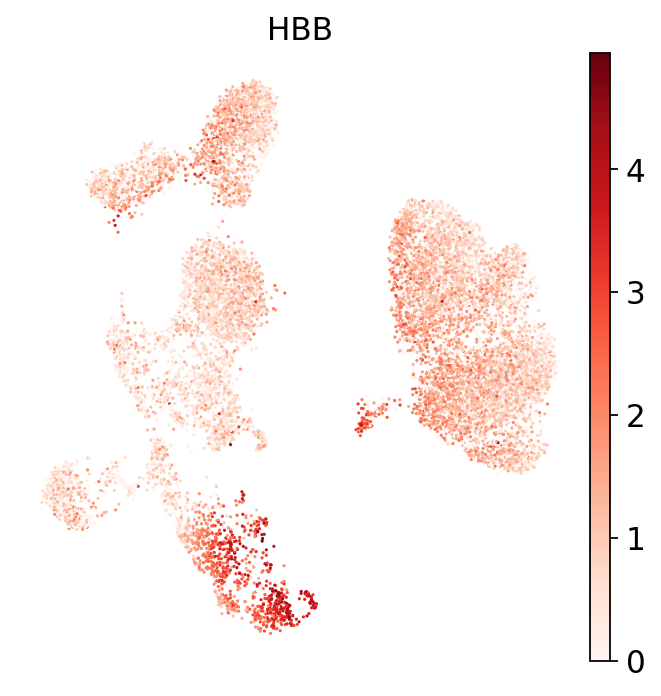

In [63]:
# a marker for the eryhtroid lineage: hemoglobulin B. Most likely the cells annotated as “Tcm/Naive helper T” (already flagged as possibly wrongly annotated based on the dendrogram above) are from the erythroid lineage!
sc.pl.umap(adata, color="HBB", cmap="Reds", frameon=False, sort_order=False)

# Annotation by mapping to a reference

### based on mapping your data to an existing, annotated single-cell reference and then performing label transfer using the resulting joint embedding


In [65]:
# preparing our data for the mapping to a reference using scArches
# mapping requires raw, unnormalized counts
adata_to_map = adata.copy()
for layer in list(adata_to_map.layers.keys()):
    if layer != "counts":
        del adata_to_map.layers[layer]
adata_to_map.X = adata_to_map.layers["counts"]

In [67]:
# use the same input features (i.e. genes) as used for reference model
# don't have this file??
#reference_model_features = pd.read_csv(
#    os.path.join(dir_reference_model, "gene_info.csv"), index_col=0
#)

In [ ]:
### reference mapping to be continued when I can figure out this file

# Data integration

### To mitigate batch effects, process each sample (biol replicate separately, then integrate at the end)
### Methods that remove batch effects in scRNA-seq are typically composed of (up to) three steps:

### 1. Dimensionality reduction
### 2. Modeling and removing the batch effect
### 3. Projection back into a high-dimensional space

### Types of data integration

### Global models (bulk transcrioptomics, ie. ComBat)

### Linear embedding models- singular value decomposition (SVD) to embed the data, then look for local neighborhoods of similar cells across batches in the embedding, which they use to correct the batch effect in a locally adaptive (non-linear) manner.
    #### Seurat integration, mutual nearest neighbors (MNN) method, Scanorama, FastMNN, Harmony
    
### Graph-based methods are typically the fastest methods to run. These approaches use a nearest-neighbor graph to represent the data from each batch. Batch effects are corrected by forcing connections between cells from different batches and then allowing for differences in cell type compositions by pruning the forced edges. The most prominent example of these approaches is the Batch-Balanced k-Nearest Neighbor (BBKNN) method

### Deep learning (DL) approaches are the most recent, and most complex methods for batch effect removal that typically require the most data for good performance. Most deep learning integration methods are based on autoencoder networks, and either condition the dimensionality reduction on the batch covariate in a conditional variational autoencoder (CVAE) or fit a locally linear correction in the embedded space. Prominent examples of DL methods are scVI, scANVI, scGen


In [1]:
# Python packages
import scanpy as sc
import scvi
import bbknn
import scib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib

# R interface
from rpy2.robjects import pandas2ri
from rpy2.robjects import r
import rpy2.rinterface_lib.callbacks
import anndata2ri

pandas2ri.activate()
anndata2ri.activate()

%load_ext rpy2.ipython

Global seed set to 0
The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
The use of converter in module rpy2.robjects.conversion is deprecated. Use rpy2.robjects.conversion.get_conversion() instead of rpy2.robjects.conversion.converter.


In [2]:
%%R
# R packages
library(Seurat)

R[write to console]: Error in (function (filename = "Rplot%03d.png", width = 480, height = 480,  : 
  Graphics API version mismatch



RRuntimeError: Error in (function (filename = "Rplot%03d.png", width = 480, height = 480,  : 
  Graphics API version mismatch


In [3]:
# read in data set
adata_raw = sc.read_h5ad(
    "data/GSE194122_openproblems_neurips2021_multiome_BMMC_processed.h5ad"
)
adata_raw.layers["logcounts"] = adata_raw.X
adata_raw

Element '/layers' was written without encoding metadata.
Element '/obs/GEX_pct_counts_mt' was written without encoding metadata.
Element '/obs/GEX_n_counts' was written without encoding metadata.
Element '/obs/GEX_n_genes' was written without encoding metadata.
Element '/obs/GEX_size_factors' was written without encoding metadata.
Element '/obs/__categories/GEX_phase' was written without encoding metadata.
Element '/obs/GEX_phase' was written without encoding metadata.
Element '/obs/ATAC_nCount_peaks' was written without encoding metadata.
Element '/obs/ATAC_atac_fragments' was written without encoding metadata.
Element '/obs/ATAC_reads_in_peaks_frac' was written without encoding metadata.
Element '/obs/ATAC_blacklist_fraction' was written without encoding metadata.
Element '/obs/ATAC_nucleosome_signal' was written without encoding metadata.
Element '/obs/__categories/cell_type' was written without encoding metadata.
Element '/obs/cell_type' was written without encoding metadata.
Eleme

AnnData object with n_obs × n_vars = 69249 × 129921
    obs: 'GEX_pct_counts_mt', 'GEX_n_counts', 'GEX_n_genes', 'GEX_size_factors', 'GEX_phase', 'ATAC_nCount_peaks', 'ATAC_atac_fragments', 'ATAC_reads_in_peaks_frac', 'ATAC_blacklist_fraction', 'ATAC_nucleosome_signal', 'cell_type', 'batch', 'ATAC_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker'
    var: 'feature_types', 'gene_id'
    uns: 'ATAC_gene_activity_var_names', 'dataset_id', 'genome', 'organism'
    obsm: 'ATAC_gene_activity', 'ATAC_lsi_full', 'ATAC_lsi_red', 'ATAC_umap', 'GEX_X_pca', 'GEX_X_umap'
    layers: 'counts', 'logcounts'

In [4]:
# look at celltype and batch
label_key = "cell_type"
batch_key = "batch"

In [5]:
# check differnet batches
adata_raw.obs[batch_key].value_counts()

batch
s4d8     9876
s4d1     8023
s3d10    6781
s1d2     6740
s1d1     6224
s2d4     6111
s2d5     4895
s3d3     4325
s4d9     4325
s1d3     4279
s2d1     4220
s3d7     1771
s3d6     1679
Name: count, dtype: int64

In [6]:
# select batches from 3 different donors
keep_batches = ["s1d3", "s2d1", "s3d7"]
adata = adata_raw[adata_raw.obs[batch_key].isin(keep_batches)].copy()
adata

AnnData object with n_obs × n_vars = 10270 × 129921
    obs: 'GEX_pct_counts_mt', 'GEX_n_counts', 'GEX_n_genes', 'GEX_size_factors', 'GEX_phase', 'ATAC_nCount_peaks', 'ATAC_atac_fragments', 'ATAC_reads_in_peaks_frac', 'ATAC_blacklist_fraction', 'ATAC_nucleosome_signal', 'cell_type', 'batch', 'ATAC_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker'
    var: 'feature_types', 'gene_id'
    uns: 'ATAC_gene_activity_var_names', 'dataset_id', 'genome', 'organism'
    obsm: 'ATAC_gene_activity', 'ATAC_lsi_full', 'ATAC_lsi_red', 'ATAC_umap', 'GEX_X_pca', 'GEX_X_umap'
    layers: 'counts', 'logcounts'

In [7]:
# look at variables
adata.var["feature_types"].value_counts()

feature_types
ATAC    116490
GEX      13431
Name: count, dtype: int64

In [8]:
# subset gene expression
adata = adata[:, adata.var["feature_types"] == "GEX"].copy()
sc.pp.filter_genes(adata, min_cells=1)
adata

AnnData object with n_obs × n_vars = 10270 × 13431
    obs: 'GEX_pct_counts_mt', 'GEX_n_counts', 'GEX_n_genes', 'GEX_size_factors', 'GEX_phase', 'ATAC_nCount_peaks', 'ATAC_atac_fragments', 'ATAC_reads_in_peaks_frac', 'ATAC_blacklist_fraction', 'ATAC_nucleosome_signal', 'cell_type', 'batch', 'ATAC_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker'
    var: 'feature_types', 'gene_id', 'n_cells'
    uns: 'ATAC_gene_activity_var_names', 'dataset_id', 'genome', 'organism'
    obsm: 'ATAC_gene_activity', 'ATAC_lsi_full', 'ATAC_lsi_red', 'ATAC_umap', 'GEX_X_pca', 'GEX_X_umap'
    layers: 'counts', 'logcounts'

In [9]:
# renormalize the data using global scaling by the total counts per cell
adata.X = adata.layers["counts"].copy()
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
adata.layers["logcounts"] = adata.X.copy()

In [10]:
# If instead, you have separate objects for each of your samples you can join them using the anndata concat() function.

In [11]:
# look at the raw fata to get an idea of how big any batch effects are and what is causing them
# perform HVG (highly variable gene) selection, PCA and UMAP
sc.pp.highly_variable_genes(adata)
sc.tl.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
adata

AnnData object with n_obs × n_vars = 10270 × 13431
    obs: 'GEX_pct_counts_mt', 'GEX_n_counts', 'GEX_n_genes', 'GEX_size_factors', 'GEX_phase', 'ATAC_nCount_peaks', 'ATAC_atac_fragments', 'ATAC_reads_in_peaks_frac', 'ATAC_blacklist_fraction', 'ATAC_nucleosome_signal', 'cell_type', 'batch', 'ATAC_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker'
    var: 'feature_types', 'gene_id', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'ATAC_gene_activity_var_names', 'dataset_id', 'genome', 'organism', 'log1p', 'hvg', 'pca', 'neighbors', 'umap'
    obsm: 'ATAC_gene_activity', 'ATAC_lsi_full', 'ATAC_lsi_red', 'ATAC_umap', 'GEX_X_pca', 'GEX_X_umap', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'logcounts'
    obsp: 'distances', 'connectivities'

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


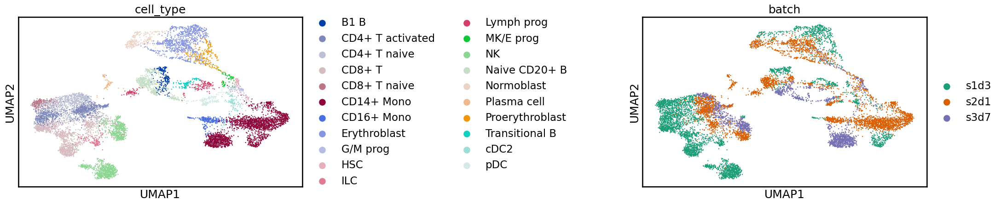

In [12]:
# plot by cell identity and batch
adata.uns[batch_key + "_colors"] = [
    "#1b9e77",
    "#d95f02",
    "#7570b3",
]  # Set custom colours for batches
sc.pl.umap(adata, color=[label_key, batch_key], wspace=1)

# Batch aware feature selection

### genes that are variable across the whole dataset could be capturing batch effects rather than the biological signals we are interested in
### scanpy will then calculate HVGs for each batch separately and combine the results by selecting those genes that are highly variable in the highest number of batches.

In [13]:
# run scanpy batch aware feature selection
sc.pp.highly_variable_genes(
    adata, n_top_genes=2000, flavor="cell_ranger", batch_key=batch_key
)
adata
adata.var

,feature_types,gene_id,n_cells,highly_variable,means,dispersions,dispersions_norm,highly_variable_nbatches,highly_variable_intersection
AL627309.5,GEX,ENSG00000241860,112,False,0.006533,0.775289,0.357973,1,False
LINC01409,GEX,ENSG00000237491,422,False,0.024462,0.716935,-0.126119,0,False
LINC01128,GEX,ENSG00000228794,569,False,0.030714,0.709340,-0.296701,0,False
NOC2L,GEX,ENSG00000188976,675,False,0.037059,0.704363,-0.494025,0,False
KLHL17,GEX,ENSG00000187961,88,False,0.005295,0.721757,-0.028456,0,False
...,...,...,...,...,...,...,...,...,...
MT-ND5,GEX,ENSG00000198786,4056,False,0.269375,0.645837,-0.457491,0,False
MT-ND6,GEX,ENSG00000198695,1102,False,0.051506,0.697710,-0.248421,0,False
MT-CYB,GEX,ENSG00000198727,5647,False,0.520368,0.613233,-0.441362,0,False
AL592183.1,GEX,ENSG00000273748,732,False,0.047486,0.753417,0.413699,0,False


highly_variable_nbatches
0    9931
1    1824
2     852
3     824
Name: count, dtype: int64

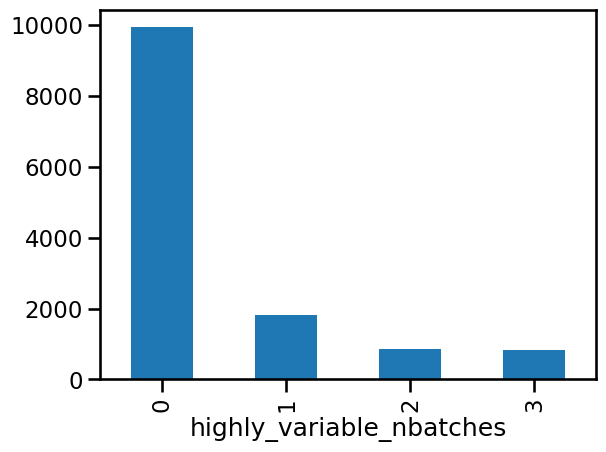

In [14]:
# check how many batches each gene was variable in
n_batches = adata.var["highly_variable_nbatches"].value_counts()
ax = n_batches.plot(kind="bar")
n_batches

In [15]:
# create an object with just the selected genes to use for integration
adata_hvg = adata[:, adata.var["highly_variable"]].copy()
adata_hvg

AnnData object with n_obs × n_vars = 10270 × 2000
    obs: 'GEX_pct_counts_mt', 'GEX_n_counts', 'GEX_n_genes', 'GEX_size_factors', 'GEX_phase', 'ATAC_nCount_peaks', 'ATAC_atac_fragments', 'ATAC_reads_in_peaks_frac', 'ATAC_blacklist_fraction', 'ATAC_nucleosome_signal', 'cell_type', 'batch', 'ATAC_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker'
    var: 'feature_types', 'gene_id', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'ATAC_gene_activity_var_names', 'dataset_id', 'genome', 'organism', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'batch_colors', 'cell_type_colors'
    obsm: 'ATAC_gene_activity', 'ATAC_lsi_full', 'ATAC_lsi_red', 'ATAC_umap', 'GEX_X_pca', 'GEX_X_umap', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'co

# Variational autoencoder (VAE) based integration
### scVI (single-cell Variational Inference), a method based on a conditional variational autoencoder
### A variational autoencoder is a type of artificial neural network which attempts to reduce the dimensionality of a dataset. The conditional part refers to conditioning this dimensionality reduction process on a particular covariate (in this case batches) such that the covariate does not affect the low-dimensional representation

In [16]:
# make a copy
adata_scvi = adata_hvg.copy()

In [17]:
# prepare data
scvi.model.SCVI.setup_anndata(adata_scvi, layer="counts", batch_key=batch_key)
adata_scvi

No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


AnnData object with n_obs × n_vars = 10270 × 2000
    obs: 'GEX_pct_counts_mt', 'GEX_n_counts', 'GEX_n_genes', 'GEX_size_factors', 'GEX_phase', 'ATAC_nCount_peaks', 'ATAC_atac_fragments', 'ATAC_reads_in_peaks_frac', 'ATAC_blacklist_fraction', 'ATAC_nucleosome_signal', 'cell_type', 'batch', 'ATAC_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', '_scvi_batch', '_scvi_labels'
    var: 'feature_types', 'gene_id', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'ATAC_gene_activity_var_names', 'dataset_id', 'genome', 'organism', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'batch_colors', 'cell_type_colors', '_scvi_uuid', '_scvi_manager_uuid'
    obsm: 'ATAC_gene_activity', 'ATAC_lsi_full', 'ATAC_lsi_red', 'ATAC_umap', 'GEX_X_pc

In [18]:
# build a model
model_scvi = scvi.model.SCVI(adata_scvi)
model_scvi

SCVI Model with the following params: 
n_hidden: 128, n_latent: 10, n_layers: 1, dropout_rate: 0.1, dispersion: gene, gene_likelihood: zinb, 
latent_distribution: normal
Training status: Not Trained
Model's adata is minified?: False

In [19]:
# model details
model_scvi.view_anndata_setup()

Anndata setup with scvi-tools version 0.20.3.

Setup via `SCVI.setup_anndata` with arguments:

{
│   'layer': 'counts',
│   'batch_key': 'batch',
│   'labels_key': None,
│   'size_factor_key': None,
│   'categorical_covariate_keys': None,
│   'continuous_covariate_keys': None
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│         n_batch          │   3   │
│         n_cells          │ 10270 │
│ n_extra_categorical_covs │   0   │
│ n_extra_continuous_covs  │   0   │
│         n_labels         │   1   │
│          n_vars          │ 2000  │
└──────────────────────────┴───────┘

               Data Registry                
┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Registry Key ┃    scvi-tools Location    ┃
┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      X       │  adata.layers['counts']   │
│    batch     │ adata.obs['_scvi_batch']  │
│    labels    │ adata.obs['_scvi_labels'] │
└──────────────┴───────────────────────────┘

                  batch State Registry                   
┏━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃  Source Location   ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['batch'] │    s1d3    │          0          │
│                    │    s2d1    │          1          │
│                    │    s3d7    │          2          │
└────────────────────┴────────────┴─────────────────────┘

                     labels State Registry                      
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_labels'] │     0      │          0          │
└───────────────────────────┴────────────┴─────────────────────┘

In [20]:
# model training with 400 epochs- for fewer than 20,000 cells. > 20,000 requires
# less epochs because there are more cells to learn from
max_epochs_scvi = np.min([round((20000 / adata.n_obs) * 400), 400])
max_epochs_scvi

400

In [21]:
# train the model (20-40 minutes)
model_scvi.train()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 400/400: 100%|███████| 400/400 [31:26<00:00,  4.68s/it, loss=648, v_num=1]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|███████| 400/400 [31:26<00:00,  4.72s/it, loss=648, v_num=1]


In [22]:
# The main result we want to extract from the trained model is the latent representation for each cell. 
# This is a multi-dimensional embedding where the batch effects have been removed that can be used in a 
# similar way to how we use PCA dimensions when analysing a single dataset.

# extract the embedding
adata_scvi.obsm["X_scVI"] = model_scvi.get_latent_representation()

In [23]:
# Calculate a batch-corrected UMAP
sc.pp.neighbors(adata_scvi, use_rep="X_scVI")
sc.tl.umap(adata_scvi)
adata_scvi

AnnData object with n_obs × n_vars = 10270 × 2000
    obs: 'GEX_pct_counts_mt', 'GEX_n_counts', 'GEX_n_genes', 'GEX_size_factors', 'GEX_phase', 'ATAC_nCount_peaks', 'ATAC_atac_fragments', 'ATAC_reads_in_peaks_frac', 'ATAC_blacklist_fraction', 'ATAC_nucleosome_signal', 'cell_type', 'batch', 'ATAC_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker', '_scvi_batch', '_scvi_labels'
    var: 'feature_types', 'gene_id', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'ATAC_gene_activity_var_names', 'dataset_id', 'genome', 'organism', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'batch_colors', 'cell_type_colors', '_scvi_uuid', '_scvi_manager_uuid'
    obsm: 'ATAC_gene_activity', 'ATAC_lsi_full', 'ATAC_lsi_red', 'ATAC_umap', 'GEX_X_pc

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


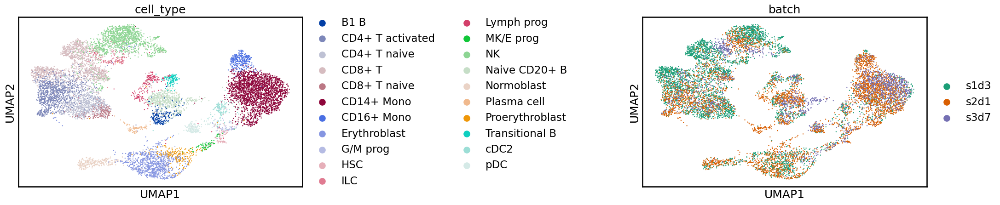

In [24]:
# plot
sc.pl.umap(adata_scvi, color=[label_key, batch_key], wspace=1)

In [25]:
# scANVI (single-cell ANnotation using Variational Inference) 
# This is an extension of the scVI model that can incorporate cell identity label information as well as batch information.

# Normally we would need to run scVI first but we have already done that here
# model_scvi = scvi.model.SCVI(adata_scvi) etc.
model_scanvi = scvi.model.SCANVI.from_scvi_model(
    model_scvi, labels_key=label_key, unlabeled_category="unlabelled"
)
print(model_scanvi)
model_scanvi.view_anndata_setup()

ScanVI Model with the following params: 
unlabeled_category: unlabelled, n_hidden: 128, n_latent: 10, n_layers: 1, dropout_rate: 0.1, dispersion: gene, 
gene_likelihood: zinb
Training status: Not Trained
Model's adata is minified?: False

Anndata setup with scvi-tools version 0.20.3.

Setup via `SCANVI.setup_anndata` with arguments:

{
│   'labels_key': 'cell_type',
│   'unlabeled_category': 'unlabelled',
│   'layer': 'counts',
│   'batch_key': 'batch',
│   'size_factor_key': None,
│   'categorical_covariate_keys': None,
│   'continuous_covariate_keys': None
}

         Summary Statistics         
┏━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃     Summary Stat Key     ┃ Value ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│         n_batch          │   3   │
│         n_cells          │ 10270 │
│ n_extra_categorical_covs │   0   │
│ n_extra_continuous_covs  │   0   │
│         n_labels         │  22   │
│          n_vars          │ 2000  │
└──────────────────────────┴───────┘

               Data Registry                
┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Registry Key ┃    scvi-tools Location    ┃
┡━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      X       │  adata.layers['counts']   │
│    batch     │ adata.obs['_scvi_batch']  │
│    labels    │ adata.obs['_scvi_labels'] │
└──────────────┴───────────────────────────┘

                  batch State Registry                   
┏━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃  Source Location   ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['batch'] │    s1d3    │          0          │
│                    │    s2d1    │          1          │
│                    │    s3d7    │          2          │
└────────────────────┴────────────┴─────────────────────┘

                       labels State Registry                       
┏━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃    Source Location     ┃    Categories    ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['cell_type'] │       B1 B       │          0          │
│                        │ CD4+ T activated │          1          │
│                        │   CD4+ T naive   │          2          │
│                        │      CD8+ T      │          3          │
│                        │   CD8+ T naive   │          4          │
│                        │    CD14+ Mono    │          5          │
│                        │    CD16+ Mono    │          6          │
│                        │   Erythroblast   │          7          │
│                        │     G/M prog     │          8          │
│                        │       HSC        │          9          │
│                        │       ILC        │         10          │
│                        │    Lymph prog    │         11          │
│                        │    MK/E prog     │         12          │
│                        │        NK        │         13          │
│                        │  Naive CD20+ B   │         14          │
│                        │    Normoblast    │         15          │
│                        │   Plasma cell    │         16          │
│                        │ Proerythroblast  │         17          │
│                        │  Transitional B  │         18          │
│                        │       cDC2       │         19          │
│                        │       pDC        │         20          │
│                        │    unlabelled    │         21          │
└────────────────────────┴──────────────────┴─────────────────────┘

In [26]:
# train scANVI- essentially refining the scvi model
max_epochs_scanvi = int(np.min([10, np.max([2, round(max_epochs_scvi / 3.0)])]))
model_scanvi.train(max_epochs=max_epochs_scanvi)

INFO     Training for 10 epochs.                                                                                   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 10/10: 100%|███████████| 10/10 [01:20<00:00,  7.88s/it, loss=747, v_num=1]

`Trainer.fit` stopped: `max_epochs=10` reached.


Epoch 10/10: 100%|███████████| 10/10 [01:20<00:00,  8.02s/it, loss=747, v_num=1]


The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


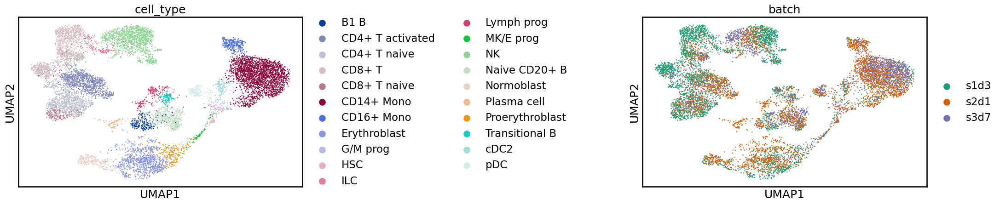

In [27]:
# We can extract the new latent representation from the model and create a new UMAP embedding as we did for scVI.

adata_scanvi = adata_scvi.copy()
adata_scanvi.obsm["X_scANVI"] = model_scanvi.get_latent_representation()
sc.pp.neighbors(adata_scanvi, use_rep="X_scANVI")
sc.tl.umap(adata_scanvi)
sc.pl.umap(adata_scanvi, color=[label_key, batch_key], wspace=1)

# Graph-based integration

### BBKNN or “Batch Balanced KNN”
### which rather than using a neural network to embed cells in a batch corrected space, instead modifies how the k-nearest neighbor (KNN) graph used for clustering and embedding is constructed.

In [28]:
# number of neighbors per batch. A suggested heuristic for this is to use 25 if there are more 
# than 100,000 cells or the default of 3 if there are fewer than 100,000.
neighbors_within_batch = 25 if adata_hvg.n_obs > 100000 else 3
neighbors_within_batch

3

In [29]:
# Before using BBKNN we first perform a PCA as we would before building a normal KNN graph. 
# Unlike scVI which models raw counts here, we start with the log-normalised expression matrix.
adata_bbknn = adata_hvg.copy()
adata_bbknn.X = adata_bbknn.layers["logcounts"].copy()
sc.pp.pca(adata_bbknn)

In [30]:
# run BBKNN with batch_key argument set
bbknn.bbknn(
    adata_bbknn, batch_key=batch_key, neighbors_within_batch=neighbors_within_batch
)
adata_bbknn

AnnData object with n_obs × n_vars = 10270 × 2000
    obs: 'GEX_pct_counts_mt', 'GEX_n_counts', 'GEX_n_genes', 'GEX_size_factors', 'GEX_phase', 'ATAC_nCount_peaks', 'ATAC_atac_fragments', 'ATAC_reads_in_peaks_frac', 'ATAC_blacklist_fraction', 'ATAC_nucleosome_signal', 'cell_type', 'batch', 'ATAC_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker'
    var: 'feature_types', 'gene_id', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'ATAC_gene_activity_var_names', 'dataset_id', 'genome', 'organism', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'batch_colors', 'cell_type_colors'
    obsm: 'ATAC_gene_activity', 'ATAC_lsi_full', 'ATAC_lsi_red', 'ATAC_umap', 'GEX_X_pca', 'GEX_X_umap', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'co

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


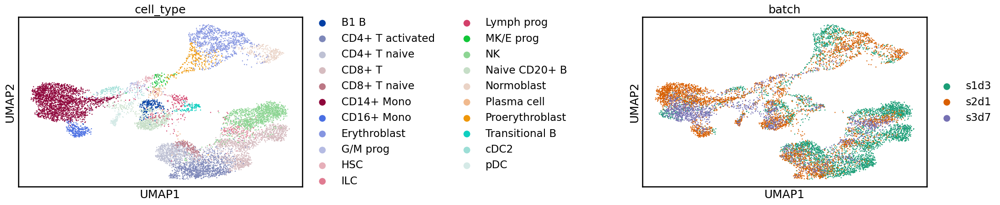

In [31]:
# construct UMAP from bbknn graph
sc.tl.umap(adata_bbknn)
sc.pl.umap(adata_bbknn, color=[label_key, batch_key], wspace=1)

# Linear embedding integration using Mutual Nearest Neighbors (MNN)

### Seurat integration method belongs to a class of linear embedding models that make use of the idea of mutual nearest neighbors (which Seurat calls anchors) to correct batch effects [Haghverdi et al., 2018]. Mutual nearest neighbors are pairs of cells from two different datasets which are in the neighborhood of each other when the datasets are placed in the same (latent) space. After finding these cells they can be used to align the two datasets and correct the differences between them.

In [32]:
# transfer data from python to R
adata_seurat = adata_hvg.copy()
# Convert categorical columns to strings
adata_seurat.obs[batch_key] = adata_seurat.obs[batch_key].astype(str)
adata_seurat.obs[label_key] = adata_seurat.obs[label_key].astype(str)
# Delete uns as this can contain arbitrary objects which are difficult to convert
del adata_seurat.uns
# prepared AnnDAta is now available in R as a SingleCellExperiment object thanks to anndata2ri
# data in R is transposed so our observations (cells) are now the columns and our variables (genes) are now the rows
adata_seurat

AnnData object with n_obs × n_vars = 10270 × 2000
    obs: 'GEX_pct_counts_mt', 'GEX_n_counts', 'GEX_n_genes', 'GEX_size_factors', 'GEX_phase', 'ATAC_nCount_peaks', 'ATAC_atac_fragments', 'ATAC_reads_in_peaks_frac', 'ATAC_blacklist_fraction', 'ATAC_nucleosome_signal', 'cell_type', 'batch', 'ATAC_pseudotime_order', 'GEX_pseudotime_order', 'Samplename', 'Site', 'DonorNumber', 'Modality', 'VendorLot', 'DonorID', 'DonorAge', 'DonorBMI', 'DonorBloodType', 'DonorRace', 'Ethnicity', 'DonorGender', 'QCMeds', 'DonorSmoker'
    var: 'feature_types', 'gene_id', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    obsm: 'ATAC_gene_activity', 'ATAC_lsi_full', 'ATAC_lsi_red', 'ATAC_umap', 'GEX_X_pca', 'GEX_X_umap', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'logcounts'
    obsp: 'distances', 'connectivities'

In [34]:
%%R -i adata_seurat
adata_seurat

The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
The use of converter in module rpy2.robjects.conversion is deprecated. Use rpy2.robjects.conversion.get_conversion() instead of rpy2.robjects.conversion.converter.
R[write to console]: Error in (function (filename = "Rplot%03d.png", width = 480, height = 480,  : 
  Graphics API version mismatch



RRuntimeError: Error in (function (filename = "Rplot%03d.png", width = 480, height = 480,  : 
  Graphics API version mismatch


In [35]:
%%R -i adata_seurat
seurat <- as.Seurat(adata_seurat, counts = "counts", data = "logcounts")
seurat

R[write to console]: Error in (function (filename = "Rplot%03d.png", width = 480, height = 480,  : 
  Graphics API version mismatch



RRuntimeError: Error in (function (filename = "Rplot%03d.png", width = 480, height = 480,  : 
  Graphics API version mismatch


In [36]:
%%R -i batch_key
batch_list <- SplitObject(seurat, split.by = batch_key)
# split objects by batch
batch_list

R[write to console]: Error in (function (filename = "Rplot%03d.png", width = 480, height = 480,  : 
  Graphics API version mismatch



RRuntimeError: Error in (function (filename = "Rplot%03d.png", width = 480, height = 480,  : 
  Graphics API version mismatch


In [ ]:
%%R
anchors <- FindIntegrationAnchors(batch_list, anchor.features = rownames(seurat))
anchors

In [ ]:
%%R
integrated <- IntegrateData(anchors)
integrated

In [ ]:
%%R -o integrated_expr
# Extract the integrated expression matrix
integrated_expr <- GetAssayData(integrated)
# Make sure the rows and columns are in the same order as the original object
integrated_expr <- integrated_expr[rownames(seurat), colnames(seurat)]
# Transpose the matrix to AnnData format
integrated_expr <- t(integrated_expr)
print(integrated_expr[1:10, 1:10])

In [ ]:
# store in anndata object
adata_seurat.X = integrated_expr
adata_seurat.layers["seurat"] = integrated_expr
print(adata_seurat)
adata.X

In [ ]:
# UMAP plot
# Reset the batch colours because we deleted them earlier
adata_seurat.uns[batch_key + "_colors"] = [
    "#1b9e77",
    "#d95f02",
    "#7570b3",
]
sc.tl.pca(adata_seurat)
sc.pp.neighbors(adata_seurat)
sc.tl.umap(adata_seurat)
sc.pl.umap(adata_seurat, color=[label_key, batch_key], wspace=1)

# Trajectories

## Inferring pseudotime for adult human bone marrow

In [1]:
from pathlib import Path

import scanpy as sc

In [6]:
DATA_DIR = Path("data/")
DATA_DIR.mkdir(parents=True, exist_ok=True)

FILE_NAME = DATA_DIR / "setty_bone_marrow.h5ad"

In [7]:
adata = sc.read(
    filename=FILE_NAME,
    backup_url="https://figshare.com/ndownloader/files/35826944",
)
adata

AnnData object with n_obs × n_vars = 5780 × 27876
    obs: 'clusters', 'palantir_pseudotime', 'palantir_diff_potential'
    var: 'palantir'
    uns: 'clusters_colors', 'palantir_branch_probs_cell_types'
    obsm: 'MAGIC_imputed_data', 'X_tsne', 'palantir_branch_probs'
    layers: 'spliced', 'unspliced'

In [8]:
# preprocess
sc.pp.filter_genes(adata, min_counts=20)
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata)

sc.tl.pca(adata)
sc.pp.neighbors(adata, n_pcs=10)

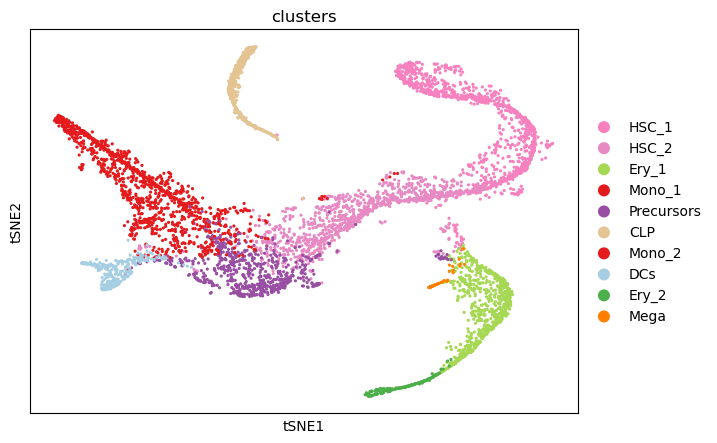

In [9]:
# t-SNE representation
sc.pl.scatter(adata, basis="tsne", color="clusters")

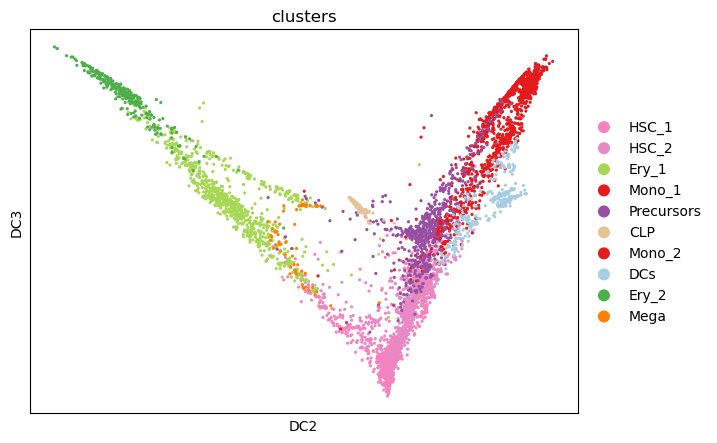

In [11]:
# calculate diffusion pseudotime (DPT)
sc.tl.diffmap(adata)
# first set the root stem cell as the most extreme diffusion component
root_ixs = adata.obsm["X_diffmap"][:, 3].argmin()
sc.pl.scatter(
    adata,
    basis="diffmap",
    color=["clusters"],
    components=[2, 3],
)

adata.uns["iroot"] = root_ixs

In [12]:
sc.tl.dpt(adata)

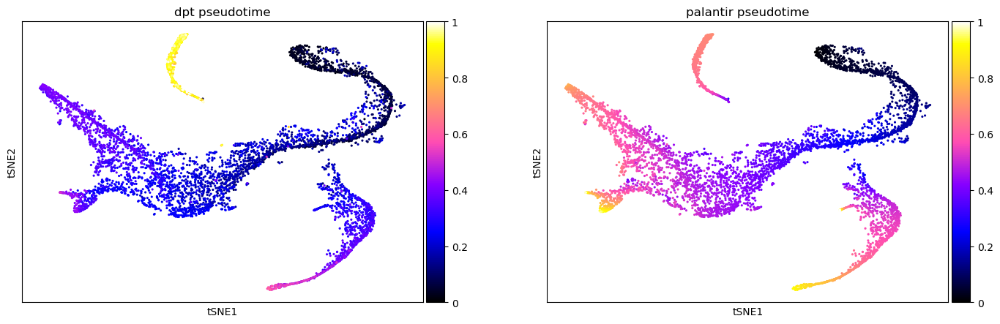

In [13]:
# compare the just computed DPT with the pre-computed Palantir pseudotime
# DPT is extremly high in the cluster of CLPs compared to all other cell 
# types. Contrastingly, the Palantir pseudotime increases continuously 
# with developmental maturity.
sc.pl.scatter(
    adata,
    basis="tsne",
    color=["dpt_pseudotime", "palantir_pseudotime"],
    color_map="gnuplot2",
)

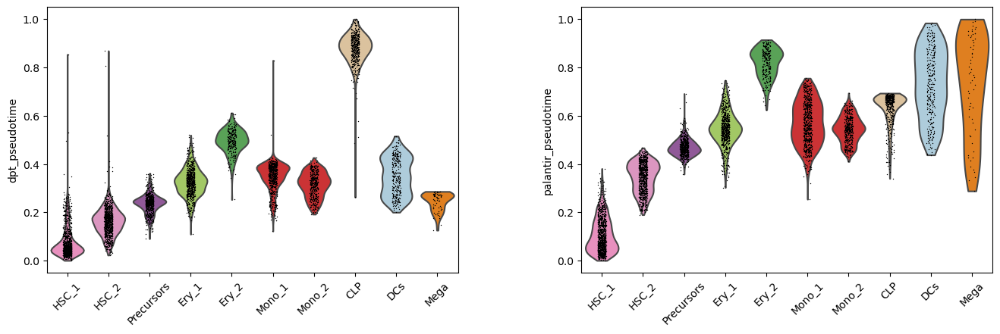

In [14]:
# show distribution of pseudotime values assigned to each cell type cluster.
sc.pl.violin(
    adata,
    keys=["dpt_pseudotime", "palantir_pseudotime"],
    groupby="clusters",
    rotation=45,
    order=[
        "HSC_1",
        "HSC_2",
        "Precursors",
        "Ery_1",
        "Ery_2",
        "Mono_1",
        "Mono_2",
        "CLP",
        "DCs",
        "Mega",
    ],
)

# RNA velocity

In [1]:
# load packages and set file path to pancreatic data (GSE132188_adata.h5ad.h5)
from pathlib import Path

import scanpy as sc
import scvelo as scv
scv.settings.set_figure_params("scvelo")
DATA_DIR = Path("data/")
DATA_DIR.mkdir(parents=True, exist_ok=True)

FILE_PATH = DATA_DIR / "GSE132188_adata.h5ad.h5"

In [2]:
# load the data
adata = scv.datasets.pancreas(file_path=FILE_PATH)
adata

AnnData object with n_obs × n_vars = 36351 × 17327
    obs: 'day', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'proliferation', 'G2M_score', 'S_score', 'clusters_fig3_final', 'clusters_fig3_final_noep', 'clusters_fig4_final', 'clusters_fig2_final', 'clusters_fig6_broad_final', 'clusters_fig6_fine_final', 'clusters_fig6_alpha_final'
    var: 'n_cells', 'highly_variable_genes', 'expression_mean', 'dispersion'
    uns: 'Ngn3+_colors', 'PCs_loading_hvg', 'clusters_fig2_final_colors', 'clusters_fig3_final_colors', 'clusters_fig3_final_noep_colors', 'clusters_fig4_final_colors', 'clusters_fig6_alpha_final_colors', 'clusters_fig6_broad_final_colors', 'clusters_fig6_fine_final_colors', 'day_colors', 'neighbors', 'pca', 'proliferation_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [3]:
# filter 
scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)

KeyError: 'spliced'